In [ ]:

!pip install numpyro

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 394.8/394.8 kB 10.5 MB/s eta 0:00:00


In [ ]:
# check this if running on GPU
import jax

# Use 32-point precision
jax.config.update("jax_enable_x64", False)

jax.default_backend()

'gpu'

In [ ]:
jax.devices()

[CudaDevice(id=0)]

In [ ]:
# Set up file system
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


In [ ]:
# download the git repo
!git clone https://github.com/ConorMesser/stats_305c.git

Cloning into 'stats_305c'...
remote: Enumerating objects: 177, done.
remote: Counting objects: 100% (177/177), done.
remote: Compressing objects: 100% (133/133), done.
remote: Total 177 (delta 98), reused 103 (delta 42), pack-reused 0 (from 0)
Receiving objects: 100% (177/177), 24.68 MiB | 15.65 MiB/s, done.
Resolving deltas: 100% (98/98), done.


In [ ]:
!cd stats_305c/; git pull

Already up to date.


In [ ]:
import stats_305c.pmf_model
import importlib

importlib.reload(stats_305c.pmf_model)

<module 'stats_305c.pmf_model' from '/content/stats_305c/pmf_model.py'>

In [ ]:
from stats_305c.pmf_model import Hybrid_PMF
from stats_305c.utils import compute_metrics, split_random_mask, split_holdout_peptides

In [ ]:

import pandas as pd
import pathlib
import matplotlib.pyplot as plt
import os
import numpy as np
import seaborn as sns
import arviz as az
import pymc as pm
from sklearn.preprocessing import StandardScaler
import pandas as pd
import math
import xarray as xr
import scipy.stats as stats
from scipy.stats import norm
from scipy.special import logsumexp
from pymc.sampling.jax import sample_numpyro_nuts
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import joblib


# Load and Process Data

In [ ]:
# file_path = '/content/drive/MyDrive/STATS305c/' # Lauren
file_path = '/content/drive/MyDrive/Courses/STATS305c/' # Conor

mic_file = pathlib.Path(os.path.join(file_path, 'data', 'MIC_data_cleaned.csv'))
cp_file = pathlib.Path(os.path.join(file_path, 'data', 'all_chem_phys_features.txt'))
embed_file = pathlib.Path(os.path.join(file_path, 'embeddings', 'all_embeddings.tsv'))

full_mic_data = pd.read_csv(mic_file)
all_chem_phys = pd.read_csv(cp_file, sep='\t', index_col=0)
all_chem_phys.index.name = 'Peptide ID'
all_embeddings = pd.read_csv(embed_file, sep='\t', index_col=0)
all_embeddings.index.name = 'Peptide ID'

# read in the taxonomy data
taxonomy_species = pd.read_csv(os.path.join(file_path, 'data', 'species_taxonomy.tsv'), sep='\t')
taxonomy_species['Target Species'] = taxonomy_species['strain']

# Initialize the scaler
scaler = StandardScaler()

# Fit the scaler (calculates mean and std) and transform the data
pc_features = all_chem_phys.iloc[:, 1:13]
pc_normalized_array = scaler.fit_transform(pc_features)

# It returns a numpy array, so convert it back to a DataFrame to keep your column names
pc_normalized = all_chem_phys.copy()
pc_normalized.iloc[:, 1:13] = pc_normalized_array

/tmp/ipykernel_1784/1505902065.py:27: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[-1.14303094 -2.58278073 -0.71110601 ... -0.56713103 -0.27918107
 -0.13520609]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  pc_normalized.iloc[:, 1:13] = pc_normalized_array
/tmp/ipykernel_1784/1505902065.py:27: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 0.00513085 -0.74668439 -0.02494176 ... -0.20537742  0.21563911
  0.12542129]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  pc_normalized.iloc[:, 1:13] = pc_normalized_array


In [ ]:
print(f"Total number of MIC rows before filtering: {full_mic_data.shape[0]}")
print(f"Total number of peptides in the dataset before filtering: {full_mic_data['Peptide ID'].nunique()}")

Total number of MIC rows before filtering: 119196
Total number of peptides in the dataset before filtering: 16968


## Get PCs from ESM features


In [ ]:

# Assuming your esm_df has the peptide IDs as the index
# and the 1280 features as the columns.
esm_features = all_embeddings.values

# 1. Standardize the features (Crucial before PCA)
scaler = StandardScaler()
esm_scaled = scaler.fit_transform(esm_features)

# 2. Fit the full PCA to analyze the variance
pca_full = PCA()
pca_full.fit(esm_scaled)

# 3. Calculate cumulative explained variance
cumulative_variance = np.cumsum(pca_full.explained_variance_ratio_)

# 4. Find the exact number of components for your thresholds
k_50 = np.argmax(cumulative_variance >= 0.50) + 1
k_70 = np.argmax(cumulative_variance >= 0.70) + 1
k_90 = np.argmax(cumulative_variance >= 0.90) + 1
k_95 = np.argmax(cumulative_variance >= 0.95) + 1
k_99 = np.argmax(cumulative_variance >= 0.99) + 1

chosen_k = k_90
print(chosen_k)

pca_final = PCA(n_components=chosen_k)
esm_pca_transformed = pca_final.fit_transform(esm_scaled)

# 2. Convert back to a DataFrame to keep your peptide index intact
esm_pca_df = pd.DataFrame(
    esm_pca_transformed,
    index=all_embeddings.index,
    columns=[f"PC_{i+1}" for i in range(chosen_k)]
)

62


## Prepare data inputs
Filter species, scale by global mean, etc.

In [ ]:
# ESM and Feature inputs
phys_chem_norm = pc_normalized.iloc[:, 1:-3].astype('float32').copy()
esm_pca_input = esm_pca_df.astype('float32').copy()
esm_input = pd.DataFrame(esm_scaled, index=esm_pca_df.index).astype('float32')

# drop nas
na_peptides = phys_chem_norm[phys_chem_norm.isna().any(axis=1)].index
phys_chem_norm.drop(index=na_peptides, inplace=True)
esm_input.drop(index=na_peptides, inplace=True)

peptides_w_data = list(set(full_mic_data['Peptide ID']) & set(all_chem_phys.index))
has_data = full_mic_data[full_mic_data['Peptide ID'].isin(peptides_w_data) &
                         ~full_mic_data['Peptide ID'].isin(na_peptides)]

has_data['mic_untransformed'] = np.log2(has_data['Activity_uM'].astype('float32'))

# Generate:
# - Test data (only a few species)
# - Selective species (~10) in 2 genus for testing hierarchical model
# - Abudnant species (>200 counts)
# - Most species (>10 counts)

def get_mic_df(original_df, species, name=''):
    test_mic = original_df[original_df['Target Species'].isin(species)].dropna(subset=['Peptide ID', 'Target Species', 'Activity_uM', 'Activity_low_uM'])
    mic_scaler = StandardScaler(with_mean=True, with_std=False)
    test_mic['mic'] = mic_scaler.fit_transform(test_mic[['mic_untransformed']].values)
    ### Changed this to save the transformed value as the mic - but should I just subtract the global mean or is the sigma transformation necessary too???

    print('\nFor model:', name)
    print('Total number of observations:', test_mic.shape[0])
    print('Num peptides:', test_mic['Peptide ID'].nunique())
    print('Num strains:', test_mic['Target Species'].nunique())
    return test_mic, mic_scaler

# - Test data (only a few species)
few_species = has_data.groupby('Target Species').size().sort_values(ascending=False).iloc[:3].index
test_few_df, test_few_scaler = get_mic_df(has_data, few_species, name='test_few')

# - Selective species in 2 genus for testing hierarchical model
tmp = has_data.groupby('Target Species').size().to_frame().join(taxonomy_species.set_index('Target Species'), how='left')
tmp = tmp[tmp['genus'].isin(['Candida','Streptococcus'])]
selective_strains = tmp[(tmp[0] > 10) & (tmp[0] < 200)]['strain'].unique()
selective_df, selective_scaler = get_mic_df(has_data, selective_strains, name='test_selective')

# - Abudnant species (>200 counts)
species_counts = has_data.groupby('Target Species').size()
top_species = species_counts[species_counts > 200].index
abundant_df, abundant_scaler = get_mic_df(has_data, top_species, name='abundant')

# - Most species (>10 counts) - lower for hierarchical model
most_species = species_counts[species_counts > 10].index
most_species_df, most_species_scaler = get_mic_df(has_data, most_species, name='most_species')


/tmp/ipykernel_1784/2748965944.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  has_data['mic_untransformed'] = np.log2(has_data['Activity_uM'].astype('float32'))



For model: test_few
Total number of observations: 13291
Num peptides: 6128
Num strains: 3

For model: test_selective
Total number of observations: 3426
Num peptides: 2244
Num strains: 91

For model: abundant
Total number of observations: 42668
Num peptides: 10473
Num strains: 56

For model: most_species
Total number of observations: 79805
Num peptides: 12617
Num strains: 1093


In [ ]:

# train-test split not really needed given LOOCV, but we can use it for final model evaluation
train_df, hold_peptides_test = split_holdout_peptides(most_species_df, holdout_frac=0.05, random_state=42)
# train_df, random_test = split_random_mask(train_df, holdout_frac=0.10, random_state=42)

[peptide holdout]  train peptides=11987  test peptides=630  (3901 obs)


# Run Models

## Full Model

In [ ]:
hpmf_model_wESMmixed_Hie = Hybrid_PMF(train_df.copy(), phys_chem_norm.copy(), taxonomy_species,
                                 dim=6, horseshoe_u=False, horseshoe_intercept=True, non_centered=True,
                                 hierarchical=True, anchor_pc=True,
                                 esm_intercept=esm_input.copy(), esm_interaction=esm_pca_input.copy(),
                                 sigma_obs_sigma=3, beta_sigma=2,
                                 esm_active_num=15, slab_scale = 4.0)

# hpmf_model_wESMmixed_Hie.draw_samples(draws=1000, tune=1500, nuts_sampler="numpyro", chains=4)  # init="jitter+adapt_diag", n_init=50000,
# hpmf_model_wESMmixed_Hie.save(os.path.join(file_path, "saved_models", "hpmf_model_wESMmixed_Hie.5_25.gt_10_species"))

idata = az.from_netcdf(os.path.join(file_path, "saved_models", "hpmf_model_wESMmixed_Hie.5_25.gt_10_species.nc"))
hpmf_model_wESMmixed_Hie.idata = idata

/usr/local/lib/python3.12/dist-packages/pytensor/tensor/blas.py:1727: FutureWarning: batched_dot is deprecated. Use `dot` in conjunction with `tensor.vectorize` or `graph.replace.vectorize_graph`
  warnings.warn(


In [ ]:
train_ESMmixed_Hie_out, test_ESMmixed_Hie_out, ESMmixed_Hie_performance = hpmf_model_wESMmixed_Hie.full_evaluation(hold_peptides_test)
ESMmixed_Hie_performance

Output()

/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Output()

Output()

Output()

{'rmse_train': np.float64(1.6103860473922613),
 'rmse_test': np.float64(2.2996608199522446),
 'elpd_train': np.float64(-149547.85885846813),
 'elpd_test': np.float64(-9007.413406477219)}

In [ ]:
train_ESMmixed_Hie_out.to_csv(os.path.join(file_path, "saved_models", "hpmf_model_wESMmixed_Hie.5_25.gt_10_species.train_out.txt"), sep='\t')
test_ESMmixed_Hie_out.to_csv(os.path.join(file_path, "saved_models", "hpmf_model_wESMmixed_Hie.5_25.gt_10_species.test_out.txt"), sep='\t')

In [ ]:
# Run Diagnositcs - R-hat over all parameters, ESS
# Seems small ESS for some params...

In [ ]:
hpmf_model_wESMmixed_Hie.idata.posterior

<xarray.Dataset> Size: 3GB
Dimensions:             (chain: 2, draw: 1000, B_pc_bottom_dim_0: 6,
                         B_pc_bottom_dim_1: 6, B_pc_diag_dim_0: 6,
                         B_pc_lower_dim_0: 15, peptide: 11987,
                         latent_factor: 6, genus: 350, species: 791,
                         strain: 1093, esm_intercept: 1280, obs_id: 75904,
                         var_fracs_dim_0: 3, phys_chem: 12)
Coordinates: (12/15)
  * chain               (chain) int64 16B 0 1
  * draw                (draw) int64 8kB 0 1 2 3 4 5 ... 994 995 996 997 998 999
  * B_pc_bottom_dim_0   (B_pc_bottom_dim_0) int64 48B 0 1 2 3 4 5
  * B_pc_bottom_dim_1   (B_pc_bottom_dim_1) int64 48B 0 1 2 3 4 5
  * B_pc_diag_dim_0     (B_pc_diag_dim_0) int64 48B 0 1 2 3 4 5
  * B_pc_lower_dim_0    (B_pc_lower_dim_0) int64 120B 0 1 2 3 4 ... 11 12 13 14
    ...                  ...
  * species             (species) int64 6kB 0 1 2 3 4 5 ... 786 787 788 789 790
  * strain              (strain) int64 9kB 0 1 2 3 4 ... 1089 1090 1091 1092
  * esm_intercept       (esm_intercept) int64 10kB 0 1 2 3 ... 1277 1278 1279
  * obs_id              (obs_id) int64 607kB 0 1 2 3 ... 75900 75901 75902 75903
  * var_fracs_dim_0     (var_fracs_dim_0) int64 24B 0 1 2
  * phys_chem           (phys_chem) int64 96B 0 1 2 3 4 5 6 7 8 9 10 11
Data variables: (12/33)
    B_pc_bottom         (chain, draw, B_pc_bottom_dim_0, B_pc_bottom_dim_1) float64 576kB ...
    B_pc_diag           (chain, draw, B_pc_diag_dim_0) float64 96kB ...
    B_pc_lower          (chain, draw, B_pc_lower_dim_0) float64 240kB ...
    U                   (chain, draw, peptide, latent_factor) float64 1GB ...
    V_genus             (chain, draw, genus, latent_factor) float64 34MB ...
    V_genus_raw         (chain, draw, genus, latent_factor) float64 34MB ...
    ...                  ...
    tau_esm_int         (chain, draw) float64 16kB ...
    var_fracs           (chain, draw, var_fracs_dim_0) float64 48kB ...
    w0_esm              (chain, draw, esm_intercept) float64 20MB ...
    w0_esm_raw          (chain, draw, esm_intercept) float64 20MB ...
    w0_pc               (chain, draw, phys_chem) float64 192kB ...
    w0_pc_sigma         (chain, draw) float64 16kB ...
Attributes:
    created_at:                 2026-05-24T07:35:44.126921+00:00
    arviz_version:              0.22.0
    inference_library:          numpyro
    inference_library_version:  0.21.0
    sampling_time:              2226.143823
    tuning_steps:               1500

In [ ]:
pep_features = az.summary(hpmf_model_wESMmixed_Hie.idata,
                          var_names=["w0_esm", "w0_pc", "B_esm", "B_pc_anchors"],
                          coords={'esm_intercept': np.random.choice(np.arange(1280), 100, replace=False),
                                  'esm_interaction': np.random.choice(np.arange(62), 40, replace=False)})
pep_features['type'] = pep_features.index.map(lambda x: x.split('[')[0])
pep_features.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)

/tmp/ipykernel_2299/2585931269.py:6: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  pep_features.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)


ess_bulk                                          ess_tail  \
type        B_esm B_pc_anchors       w0_esm       w0_pc       B_esm   
count  240.000000     6.000000   100.000000   12.000000  240.000000   
mean     8.308333    12.500000   762.250000  481.916667   38.945833   
std      4.431337     4.929503   203.202908   92.176174   47.504340   
min      5.000000     6.000000   398.000000  321.000000   11.000000   
25%      6.000000     8.750000   625.500000  431.500000   20.000000   
50%      7.000000    13.000000   714.500000  486.500000   28.000000   
75%      9.000000    16.500000   870.750000  534.000000   41.250000   
max     46.000000    18.000000  1414.000000  669.000000  604.000000   

                                                   r_hat               \
type  B_pc_anchors       w0_esm        w0_pc       B_esm B_pc_anchors   
count     6.000000   100.000000    12.000000  240.000000     6.000000   
mean     75.666667  1429.730000  1033.583333    1.607667     1.316667   
std      76.852239   739.958624   161.837999    0.290143     0.198057   
min      28.000000   251.000000   739.000000    1.060000     1.140000   
25%      35.500000   771.500000   923.000000    1.360000     1.192500   
50%      50.000000  1424.000000  1029.500000    1.605000     1.235000   
75%      61.500000  2091.000000  1146.000000    1.822500     1.397500   
max     230.000000  2816.000000  1330.000000    2.480000     1.660000   

                              
type       w0_esm      w0_pc  
count  100.000000  12.000000  
mean     1.003700   1.008333  
std      0.004852   0.007177  
min      1.000000   1.000000  
25%      1.000000   1.000000  
50%      1.000000   1.010000  
75%      1.010000   1.010000  
max      1.010000   1.020000

In [ ]:
intercepts_interactions = az.summary(hpmf_model_wESMmixed_Hie.idata,
                        var_names=["alpha_peptide", "beta_genus", "beta_species", "beta_strain",
                                   "U", "V_genus", "V_species", "V_strains"],
                        coords={'peptide': np.random.choice(hpmf_model_wESMmixed_Hie.model.coords["peptide"], 100, replace=False),
                                'genus': np.random.choice(hpmf_model_wESMmixed_Hie.model.coords["genus"], 10, replace=False),
                                'species': np.random.choice(hpmf_model_wESMmixed_Hie.model.coords["species"], 30, replace=False),
                                'strain': np.random.choice(hpmf_model_wESMmixed_Hie.model.coords["strain"], 30, replace=False)})
intercepts_interactions['type'] = intercepts_interactions.index.map(lambda x: x.split('[')[0])
intercepts_interactions.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)

/tmp/ipykernel_2299/2645031905.py:9: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  intercepts_interactions.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)


ess_bulk                                                      \
type            U      V_genus    V_species   V_strains alpha_peptide   
count  600.000000    60.000000   180.000000  180.000000    100.000000   
mean     6.576667   716.800000   592.333333   33.238889    957.080000   
std      2.144400   390.867302   425.845567   75.073548    194.401526   
min      5.000000    13.000000     9.000000    5.000000    543.000000   
25%      5.000000   489.500000    54.500000    9.000000    849.000000   
50%      6.000000   885.000000   818.000000   15.000000    970.000000   
75%      7.000000   986.250000   954.250000   28.250000   1057.750000   
max     36.000000  1236.000000  1197.000000  798.000000   1595.000000   

                                                ess_tail               ...  \
type    beta_genus beta_species  beta_strain           U      V_genus  ...   
count    10.000000    30.000000    30.000000  600.000000    60.000000  ...   
mean    714.200000   735.366667   852.266667   25.006667  1265.450000  ...   
std     244.763741   203.789696   430.849196   13.798089   517.574343  ...   
min     224.000000   393.000000   442.000000   11.000000    64.000000  ...   
25%     566.000000   560.000000   608.000000   16.000000  1196.750000  ...   
50%     773.500000   777.500000   687.000000   22.000000  1464.500000  ...   
75%     859.750000   899.250000   805.500000   29.000000  1593.000000  ...   
max    1073.000000  1062.000000  2008.000000  123.000000  1911.000000  ...   

                                      r_hat                         \
type  beta_species  beta_strain           U    V_genus   V_species   
count    30.000000    30.000000  600.000000  60.000000  180.000000   
mean   1287.033333  1552.733333    1.786533   1.027000    1.053667   
std     265.226446   615.277954    0.302804   0.051265    0.088342   
min     818.000000   920.000000    1.100000   1.000000    1.000000   
25%    1105.750000  1116.750000    1.560000   1.000000    1.000000   
50%    1309.000000  1342.000000    1.760000   1.000000    1.010000   
75%    1486.500000  1712.500000    1.992500   1.030000    1.060000   
max    1800.000000  3112.000000    2.740000   1.220000    1.400000   

                                                                     
type    V_strains alpha_peptide beta_genus beta_species beta_strain  
count  180.000000    100.000000  10.000000    30.000000   30.000000  
mean     1.279056      1.001900   1.007000     1.004667    1.005000  
std      0.237112      0.003943   0.006749     0.006288    0.005085  
min      1.000000      1.000000   1.000000     1.000000    1.000000  
25%      1.100000      1.000000   1.000000     1.000000    1.000000  
50%      1.195000      1.000000   1.010000     1.000000    1.005000  
75%      1.370000      1.000000   1.010000     1.010000    1.010000  
max      2.020000      1.010000   1.020000     1.020000    1.010000  

[8 rows x 24 columns]

In [ ]:
intercepts_interactions[(intercepts_interactions['type'] == 'U') &
                              (intercepts_interactions['r_hat'] > 1.05)].index.map(lambda x: x[-2]).value_counts()

,count
0,100
1,100
2,100
3,100
4,100
5,100


In [ ]:
intercepts_interactions[(intercepts_interactions['type'] == 'U') &
                        (intercepts_interactions['r_hat'] > 1.05)].index.map(lambda x: x.split('[')[1].split(',')[0]).value_counts().sort_values()

,count
250,6
423,6
413,6
393,6
282,6
...,...
279,6
435,6
492,6
210,6


In [ ]:
az.summary(hpmf_model_wESMmixed_Hie.idata,
           var_names=["sigma_obs", "beta_genus_sigma", "beta_species_sigma", "beta_strain_sigma",
                      "sig_genus", "sig_species", "sig_strain", "sigma_b_esm", "sigma_b_pc"])


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma_obs,1.660,0.005,1.651,1.668,0.000,0.000,1246.0,1536.0,1.00
beta_genus_sigma,0.973,0.110,0.761,1.174,0.010,0.004,135.0,416.0,1.03
beta_species_sigma,0.458,0.088,0.297,0.626,0.007,0.003,155.0,324.0,1.01
beta_strain_sigma,0.859,0.033,0.798,0.919,0.002,0.001,173.0,592.0,1.03
sig_genus,0.409,0.043,0.327,0.492,0.003,0.002,183.0,349.0,1.02
sig_species,0.309,0.049,0.224,0.408,0.005,0.003,117.0,173.0,1.02
sig_strain,0.856,0.020,0.819,0.894,0.001,0.001,293.0,687.0,1.01
sigma_b_esm,0.018,0.001,0.016,0.019,0.000,0.000,488.0,1271.0,1.00
sigma_b_pc,0.078,0.009,0.061,0.096,0.000,0.000,403.0,744.0,1.02


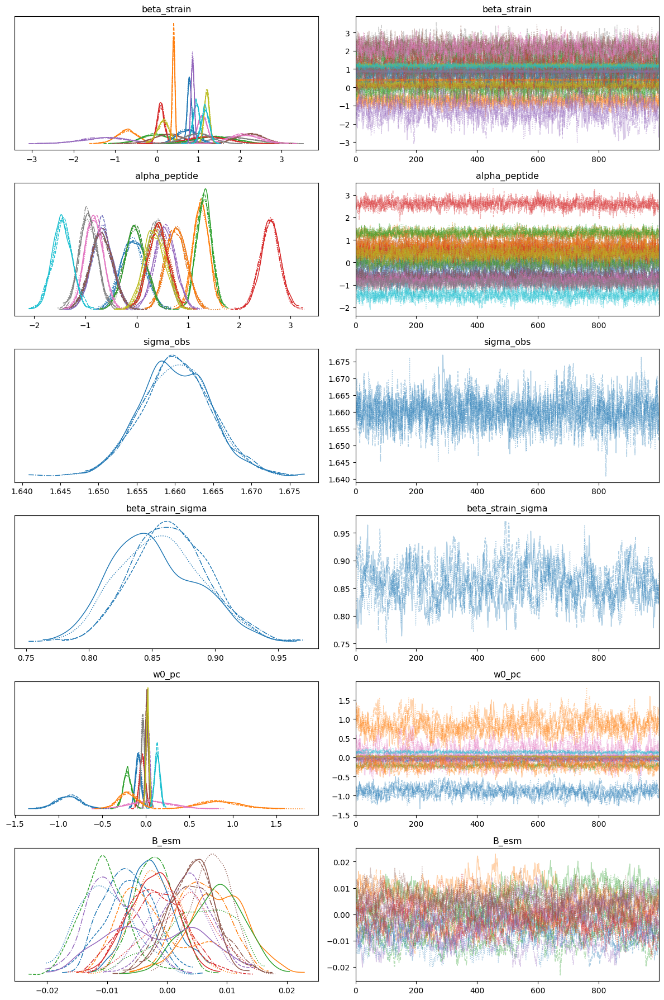

In [ ]:
idata = hpmf_model_wESMmixed_Hie.idata
peptide_list=train_df['Peptide ID'].unique()[:20]
species_list=train_df['Target Species'].unique()[:20]

# Always plot the global mean
var_names = []
coords = {}

if species_list is not None:
    var_names.append("beta_strain")
    # Convert string names to the integer indices used in the model
    coords["strain"] = [hpmf_model_wESMmixed_Hie.strain_dict[s] for s in species_list]

if peptide_list is not None:
    var_names.append("alpha_peptide")
    coords["peptide"] = [hpmf_model_wESMmixed_Hie.peptide_dict[p] for p in peptide_list]

var_names.append("sigma_obs")
var_names.append("beta_strain_sigma")
var_names.append("w0_pc")
var_names.append("B_esm")

coords["esm_interaction"] = np.arange(1)


# Plot using ArviZ
az.plot_trace(idata, var_names=var_names, coords=coords, figsize=(12, 3 * len(var_names)))
plt.tight_layout()
plt.show()

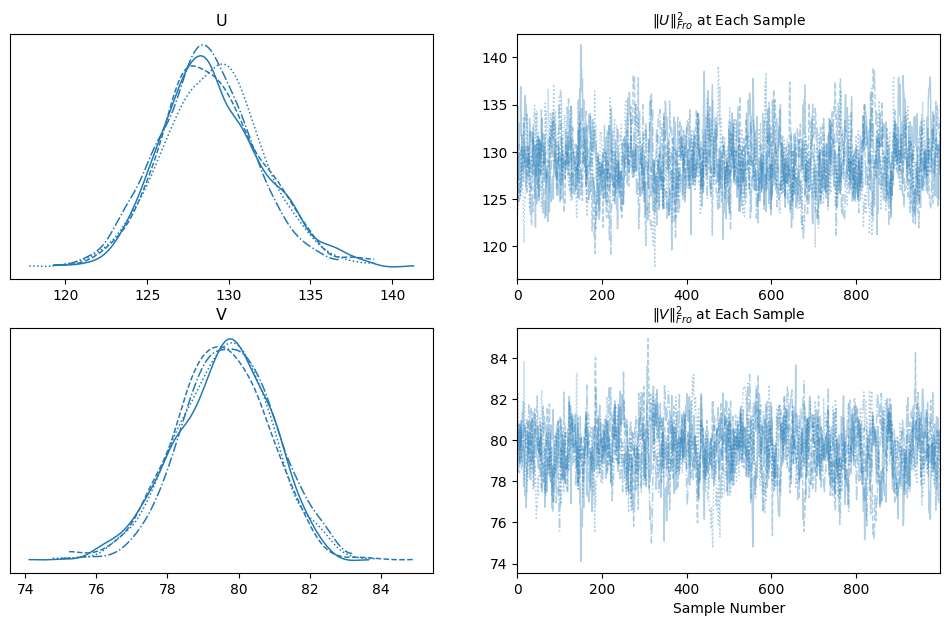

In [ ]:
hpmf_model_wESMmixed_Hie.traceplot()

### Summarize Failures

In [ ]:
# see best prediction (high ELPD and low RMSE)
best_pred = train_ESMmixed_Hie_out.sort_values(by=['elpd', 'error'], ascending=[False,True]).iloc[:20]
best_pred

,Peptide ID,Peptide Sequence,Target Species,Activity Measure,Activity,Unit,pH,Ionic Strength mM,"""Salt Type""",Medium,...,num_X_O,MW,Activity_uM,Activity_low_uM,mic_untransformed,mic,strain_idx,peptide_idx,elpd,error
113722,3116,GLLKRIKTLL,Staphylococcus aureus ATCC 25923,MIC,32.0,µM,NaN,4.5,KCl,MHB,...,0,1154.4888,32.000000,16.000000,5.000000,1.422267,26,11172,-1.429945,-0.088961
65826,13859,GLLkRIkTLL,Staphylococcus aureus ATCC 25923,MIC,32.0,µM,NaN,NaN,NaN,MHB,...,0,1154.4888,32.000000,16.000000,5.000000,1.422267,26,7222,-1.429945,-0.063581
25525,9986,FFHHIFRGIVHVGKKIHRLVTG,Escherichia coli ATCC 25922,MIC,3.5,µM,NaN,NaN,NaN,MHB,...,0,2599.0911,3.500000,1.750000,1.807355,-1.770378,11,2907,-1.430189,0.051370
61883,13069,AARIILRTRFR,Escherichia coli ATCC 25922,MIC,16.0,µM,NaN,0.008,FeCl3,MHB,...,0,1372.6644,16.000000,8.000000,4.000000,0.422267,11,6686,-1.430210,0.037944
69479,14590,LRLKKRRWHYRVpP,Pseudomonas aeruginosa ATCC 27853,MIC,25.0,µg/ml,NaN,NaN,NaN,MHB,...,0,1905.3017,13.121282,6.560641,3.713837,0.136104,14,7631,-1.430379,-0.020090
104029,14886,KRIVQRIKDFLR,Escherichia coli ATCC 25922,MIC,16.0,µg/ml,NaN,200,NaCl,LYM,...,0,1571.9112,10.178692,5.089346,3.347480,-0.230252,11,9996,-1.430386,0.105567
8618,5887,FLKLLKKLL,Pseudomonas aeruginosa ATCC 27853,MIC,16.0,µg/ml,NaN,NaN,5% serum,MHB,...,0,1115.4940,14.343421,7.171710,3.842317,0.264585,14,996,-1.430393,-0.037543
55823,11846,FLKLLkKLL,Pseudomonas aeruginosa ATCC 27853,MIC,16.0,µg/ml,NaN,150,NaCl,MHB,...,0,1115.4940,14.343421,7.171710,3.842317,0.264585,14,6022,-1.430393,-0.059549
55841,11849,FLKLLKKLl,Pseudomonas aeruginosa ATCC 27853,MIC,16.0,µg/ml,NaN,150,NaCl,MHB,...,0,1115.4940,14.343421,7.171710,3.842317,0.264585,14,6025,-1.430393,-0.059548
55761,11833,flkllkkll,Pseudomonas aeruginosa ATCC 27853,MIC,16.0,µg/ml,NaN,NaN,.,MHB,...,0,1115.4940,14.343421,7.171710,3.842317,0.264585,14,6010,-1.430393,-0.036254


In [ ]:
test_ESMmixed_Hie_out.loc[113722]

,104699
Peptide ID,15051
Peptide Sequence,KRIVQRAKDFLR
Target Species,Staphylococcus aureus ATCC 29213
Activity Measure,MIC
Activity,40.0
Unit,µM
pH,NaN
Ionic Strength mM,NaN
"""Salt Type""",NaN
Medium,TSB


(<xarray.DataArray 'x' (chain: 4, draw: 1000)> Size: 32kB
 array([[1.38267101, 1.42975544, 1.37479973, ..., 1.41229952, 1.51367469,
         1.57002942],
        [1.99222696, 1.48127508, 1.5681504 , ..., 1.38659056, 1.46255651,
         1.42750728],
        [1.31663053, 1.47387689, 1.32654007, ..., 1.55132188, 1.55942558,
         1.30567749],
        [1.75967328, 1.3129767 , 1.59954098, ..., 1.7682166 , 1.50399631,
         1.53283591]])
 Coordinates:
   * chain    (chain) int64 32B 0 1 2 3
   * draw     (draw) int64 8kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
     peptide  int64 8B 11172
     strain   int64 8B 26,
 <Axes: title={'center': 'Expected log(MIC)\n3116 vs Staphylococcus aureus ATCC 25923'}>)

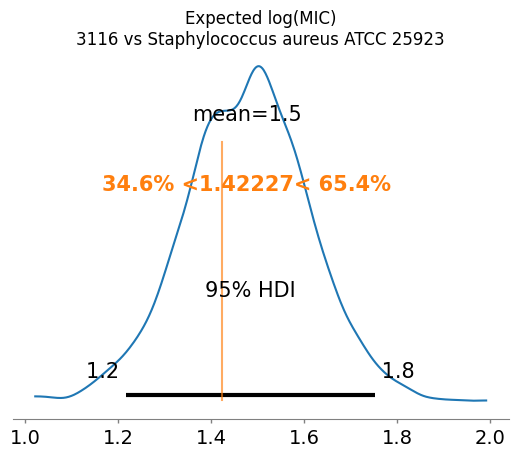

In [ ]:
tmp_df = most_species_df.reset_index().copy()
tmp_df = tmp_df.merge(taxonomy_species.drop_duplicates(), on='Target Species', how='left')
tmp_df.set_index('index', inplace=True)

hpmf_model_wESMmixed_Hie.plot_mic_posterior(tmp_df.loc[113722]['Peptide ID'],
                                             tmp_df.loc[113722]['strain'],
                                             true_mic=tmp_df.loc[113722]['mic'])

In [ ]:
# see worst prediction (low ELPD and high RMSE)
worst_pred = train_ESMmixed_Hie_out.sort_values(by=['elpd', 'error'], ascending=[True,False]).iloc[:20]
worst_pred

,Peptide ID,Peptide Sequence,Target Species,Activity Measure,Activity,Unit,pH,Ionic Strength mM,"""Salt Type""",Medium,...,num_X_O,MW,Activity_uM,Activity_low_uM,mic_untransformed,mic,strain_idx,peptide_idx,elpd,error
19746,8642,VAVLVLGA,Enterococcus faecalis V583,MIC,0.000022,µg/ml,NaN,NaN,NaN,M9-G,...,0,740.9306,0.000030,0.000015,-15.039547,-18.617279,787,2255,-42.454612,-12.355635
2451,4794,ILPWKWPWAPARR,Candida albicans,MIC,0.002000,µg/ml,NaN,NaN,NaN,MHB,...,0,1677.0053,0.001193,0.000596,-9.711672,-13.289405,9,299,-36.638102,-13.685329
10510,6615,MSWLNFLKYIAKYGKKAVSAAWKYKGKVLEWLNVGPTLEWVWQKLK...,Micrococcus luteus ATCC 4698,MIC,0.000870,µg/ml,NaN,NaN,NaN,MHA,...,0,5984.1504,0.000145,0.000073,-12.747844,-16.325577,513,1203,-27.429187,-11.218154
115146,3341,TWLKKRRWKKAKpP,Pseudomonas aeruginosa PAO1,MIC,0.004000,µg/ml,NaN,NaN,NaN,CAMHB,...,0,1823.2378,0.002194,0.001097,-8.832287,-12.410020,81,11333,-26.843128,-11.700214
2445,4793,ILPWKWPWWPARR,Candida albicans,MIC,0.008000,µg/ml,NaN,NaN,NaN,MHB,...,0,1792.1373,0.004464,0.002232,-7.807466,-11.385199,9,298,-25.293015,-11.199765
41053,18993,GLLSRLRDFLSDRGRRLGEKIERIGQKIKDLSERFQS,Staphylococcus aureus ATCC 25923,MIC,0.007800,µg/ml,NaN,NaN,NaN,MHB,...,0,4373.9751,0.001783,0.000892,-9.131255,-12.708988,26,4444,-21.867183,-10.466912
10568,6636,YRQSMNNFQGLRSFGCRFGTCTVQKLAHQIYQFTDKDKDNVAPRSK...,Porphyromonas gingivalis ATCC 33277,MIC,0.000775,µg/ml,NaN,NaN,NaN,BHIB,...,0,6031.7331,0.000128,0.000064,-12.926088,-16.503820,638,1206,-21.856575,-8.456064
65905,13884,GFGGGRGGFGGGRGGFGGGGIGGGGFGGGYGGGKIKG,Pseudomonas aeruginosa ATCC 27853,MIC,0.100000,µg/ml,NaN,NaN,NaN,PB,...,0,3048.2487,0.032806,0.016403,-4.929909,-8.507642,14,7233,-20.312403,-9.788648
81406,351,CAKAKAKAGSGAKAKAKAC,Pseudomonas aeruginosa ATCC 27853,MIC,0.005000,µM,NaN,NaN,NaN,MHB,...,0,1763.1380,0.005000,0.002500,-7.643856,-11.221589,14,7864,-20.051045,-9.804203
81408,351,CAKAKAKAGSGAKAKAKAC,Salmonella enterica subsp. enterica serovar Ty...,MIC,0.005000,µM,NaN,NaN,NaN,MHB,...,0,1763.1380,0.005000,0.002500,-7.643856,-11.221589,228,7864,-19.516234,-9.625391


In [ ]:
test_ESMmixed_Hie_out.loc[10510]

,93181
Peptide ID,2121
Peptide Sequence,GGAGHVPEYFVGIGTPISFYG
Target Species,Escherichia coli K99
Activity Measure,MIC
Activity,0.03
Unit,µg/ml
pH,NaN
Ionic Strength mM,NaN
"""Salt Type""",NaN
Medium,MHB


(<xarray.DataArray 'x' (chain: 4, draw: 1000)> Size: 32kB
 array([[-5.47099405, -5.22030033, -5.61464263, ..., -4.94764713,
         -4.7210666 , -5.09597597],
        [-5.62760535, -5.45603365, -5.39336863, ..., -5.55481005,
         -3.80827723, -4.6764383 ],
        [-5.64704166, -5.02790674, -4.94472791, ..., -5.54309512,
         -4.82140385, -4.54540438],
        [-6.06439245, -4.36093791, -4.53090684, ..., -7.01973962,
         -6.03175934, -6.21314547]])
 Coordinates:
   * chain    (chain) int64 32B 0 1 2 3
   * draw     (draw) int64 8kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
     peptide  int64 8B 1203
     strain   int64 8B 513,
 <Axes: title={'center': 'Expected log(MIC)\n6615 vs Micrococcus luteus ATCC 4698'}>)

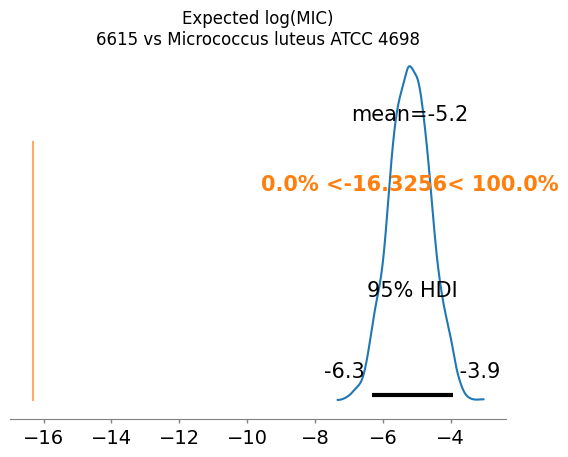

In [ ]:

hpmf_model_wESMmixed_Hie.plot_mic_posterior(tmp_df.loc[10510]['Peptide ID'],
                                             tmp_df.loc[10510]['strain'],
                                             true_mic=tmp_df.loc[10510]['mic'])

<Axes: xlabel='error', ylabel='elpd'>

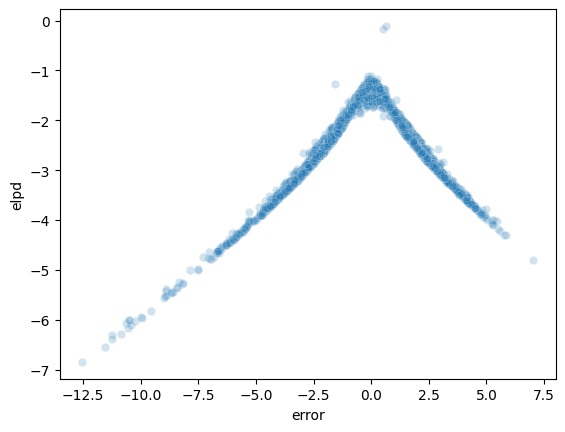

In [ ]:
# train_ESMmixed_Hie_out

# test_ESMmixed_Hie_out

# Scatterplot with RMSE vs. ELPD
# ax = sns.scatterplot(train_ESMmixed_Hie_out, x='error', y='elpd', label='Train')
sns.scatterplot(test_ESMmixed_Hie_out, x='error', y='elpd', alpha=0.2)


<Axes: xlabel='error', ylabel='mic'>

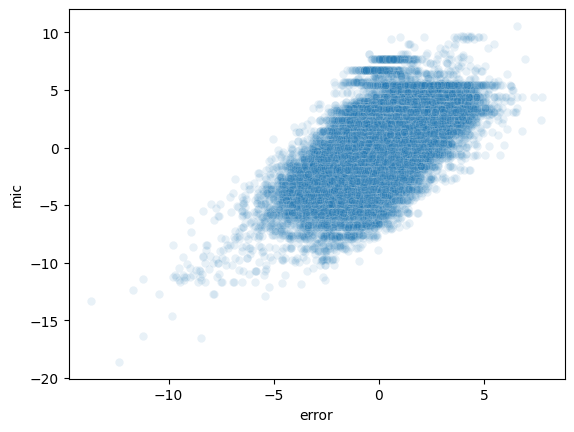

In [ ]:
sns.scatterplot(train_ESMmixed_Hie_out, x='error', y='mic',alpha=0.1)


In [ ]:
strains = list(hpmf_model_wESMmixed_Hie.strain_dict.keys())
tmp_df = taxonomy_species.drop_duplicates().set_index('Target Species').loc[strains]

counts = train_df['Target Species'].value_counts()
tmp_df['obs_counts'] = counts.loc[strains]

species_sums = tmp_df.groupby('species')['obs_counts'].sum()
species_sums.name = 'species_counts'
tmp_df = tmp_df.merge(species_sums, right_index=True, left_on='species')
genus_sums = tmp_df.groupby('genus')['obs_counts'].sum()
genus_sums.name = 'genus_counts'
tmp_df = tmp_df.merge(genus_sums, right_index=True, left_on='genus')

tmp_df = train_ESMmixed_Hie_out.merge(tmp_df, left_on='Target Species', right_on='Target Species', how='left')



In [ ]:

pep_counts = tmp_df['Peptide ID'].value_counts()
pep_counts.name = 'Peptide_obs_counts'
tmp_df = tmp_df.merge(pep_counts, left_on='Peptide ID', right_index=True)

In [ ]:
tmp_df = tmp_df.merge(phys_chem_norm, left_on='Peptide ID', right_index=True)

<Axes: xlabel='elpd', ylabel='species_counts'>

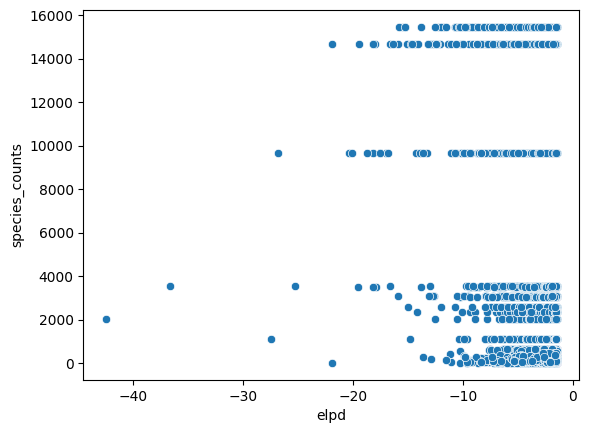

In [ ]:
sns.scatterplot(tmp_df, x='elpd', y='species_counts')

/tmp/ipykernel_601/3935384498.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=worst_df[worst_df['Target Species'].isin(top_species)],


<Axes: xlabel='count', ylabel='Target Species'>

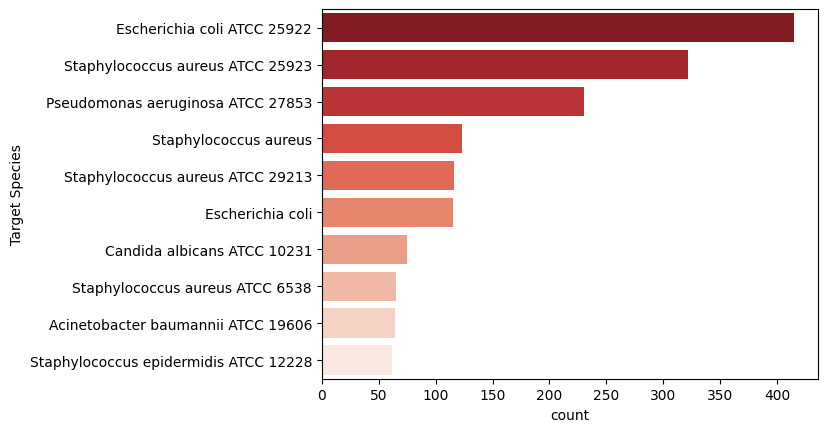

In [ ]:
threshold = tmp_df['error'].abs().quantile(0.95)
worst_df = tmp_df[tmp_df['error'].abs() >= threshold].copy()

top_species = worst_df['Target Species'].value_counts().head(10).index
sns.countplot(data=worst_df[worst_df['Target Species'].isin(top_species)],
              y="Target Species", order=top_species, palette="Reds_r")

# but these are just the species with the most observations already.

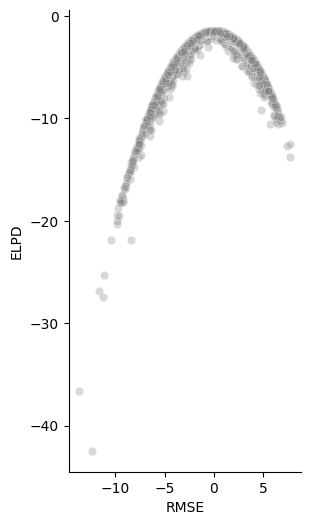

In [ ]:
fig, ax = plt.subplots(figsize=(3, 6))
sns.scatterplot(tmp_df, x='error', y='elpd', alpha=0.3, c='gray', ax=ax)
sns.despine()
plt.ylabel('ELPD')
plt.xlabel("RMSE")
plt.savefig(os.path.join(file_path, 'figures', 'error_plot.png'), bbox_inches='tight')


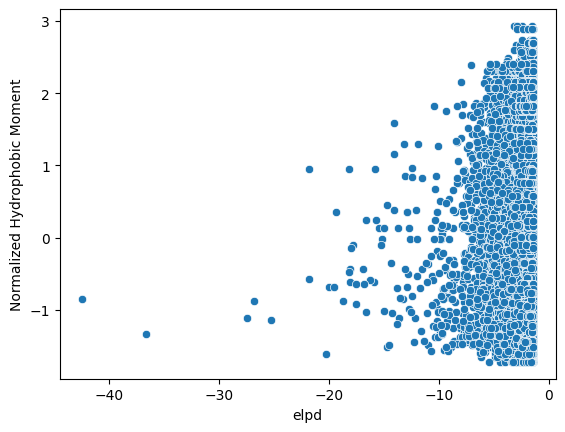

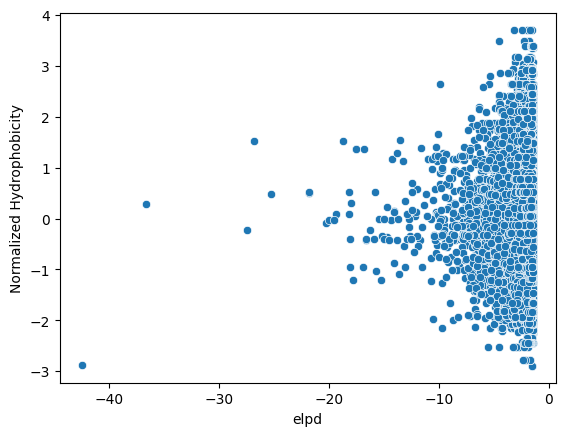

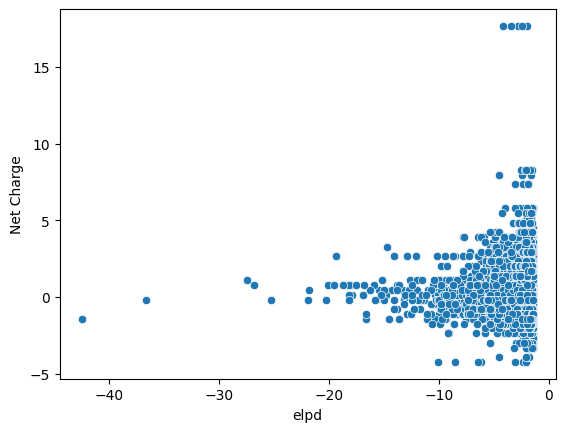

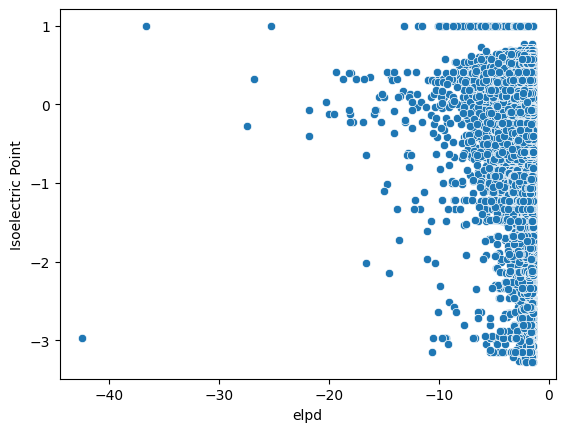

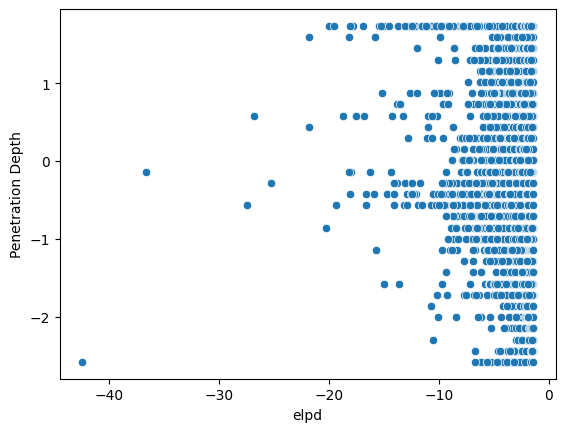

...

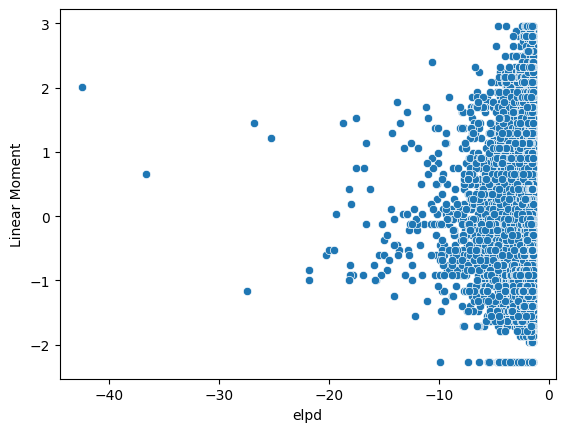

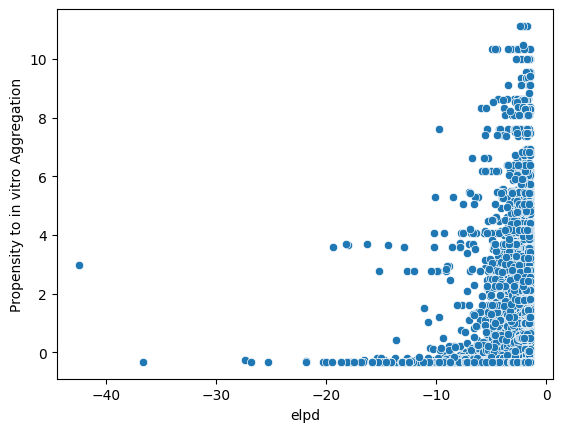

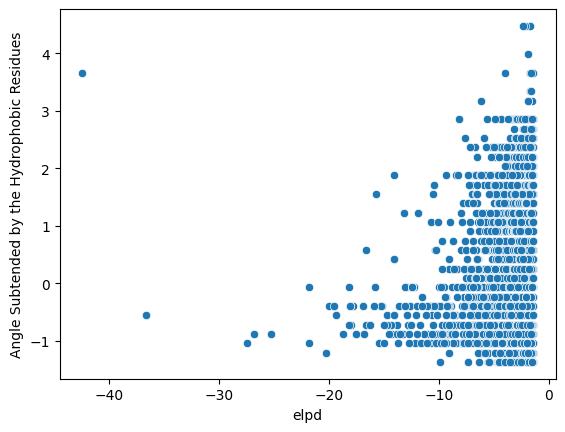

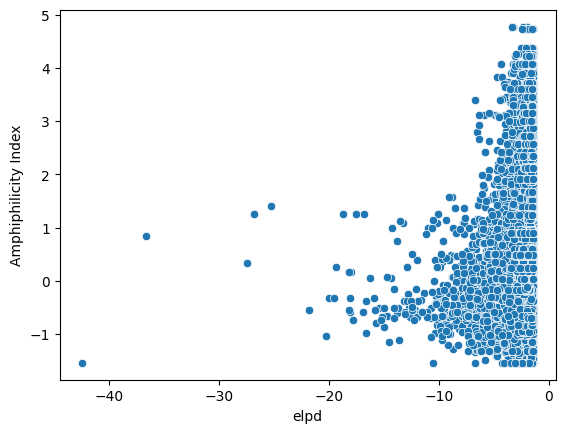

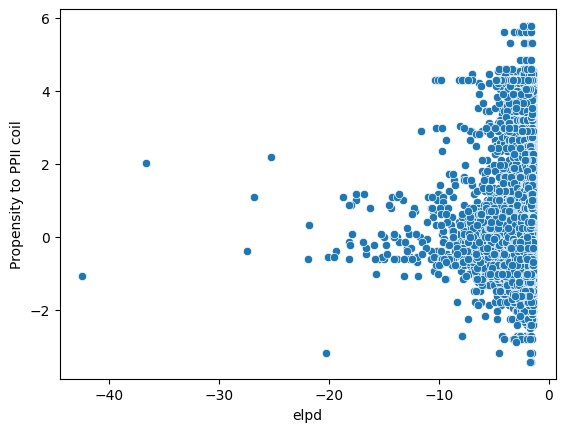

In [ ]:
for col in phys_chem_norm.columns:
  ax = sns.scatterplot(tmp_df, x='elpd', y=col)
  plt.show()

<Axes: xlabel='censored_high', ylabel='elpd'>

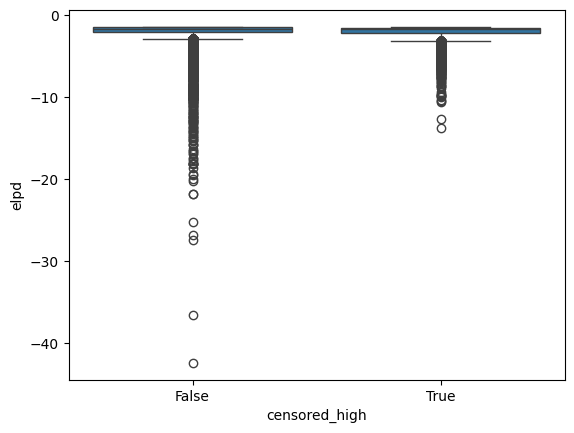

In [ ]:
sns.boxplot(tmp_df, x='censored_high', y='elpd')

<Axes: xlabel='range', ylabel='elpd'>

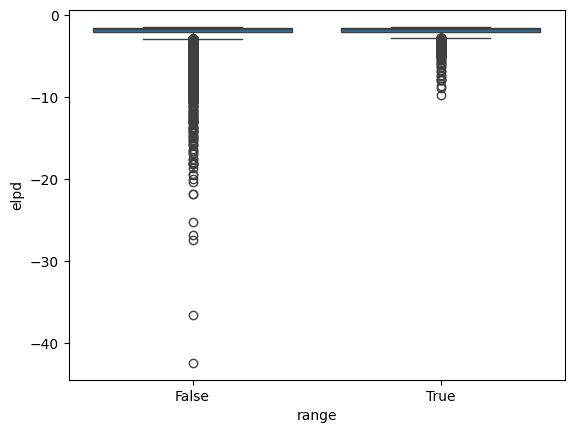

In [ ]:
sns.boxplot(tmp_df, x='range', y='elpd')

<Axes: xlabel=' "Salt Type"', ylabel='elpd'>

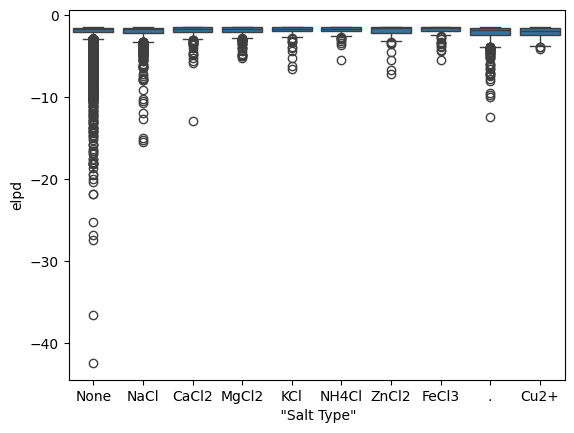

In [ ]:
top_salts = tmp_df.fillna('None')[' "Salt Type"'].value_counts().iloc[:10].index

sns.boxplot(tmp_df.fillna('None')[tmp_df.fillna('None')[' "Salt Type"'].isin(top_salts)], x=' "Salt Type"', y='elpd')

<Axes: xlabel='Medium', ylabel='elpd'>

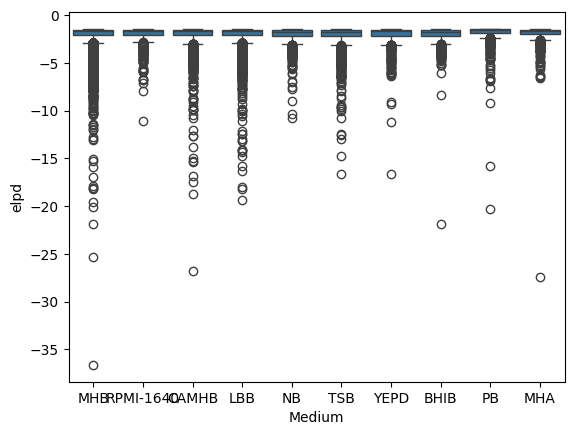

In [ ]:
top_mediums = tmp_df['Medium'].value_counts().iloc[:10].index
sns.boxplot(tmp_df.fillna('None')[tmp_df.fillna('None')['Medium'].isin(top_mediums)], x='Medium', y='elpd')

<Axes: xlabel='Reference', ylabel='elpd'>

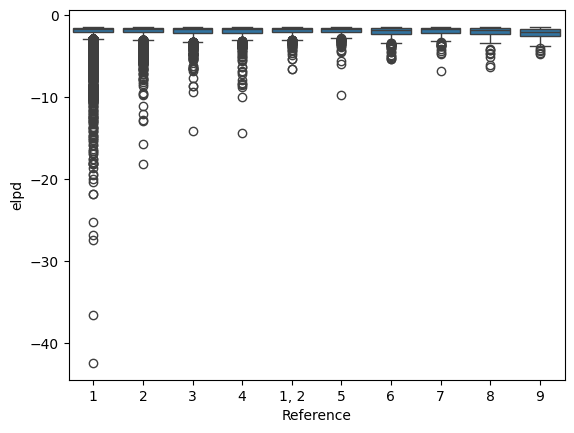

In [ ]:
ref= tmp_df['Reference'].value_counts().iloc[:10].index
sns.boxplot(tmp_df[tmp_df['Reference'].isin(ref)], x='Reference', y='elpd')

### Explore Intercept Posteriors

In [ ]:
taxonomy_species

In [ ]:
hpmf_model_wESMmixed_Hie.idata.posterior.beta_strain.mean(("chain", "draw")).values

In [ ]:
hpmf_model_wESMmixed_Hie.idata.posterior.w0_pc.mean(("chain", "draw")).values

In [ ]:
idata = hpmf_model_wESMmixed_Hie.idata

var_names = []

var_names.append("w0_pc")

# Plot using ArviZ
az.plot_trace(idata, var_names=var_names,figsize=(12, 3 * len(var_names)))


In [ ]:
hpmf_model_wESMmixed_Hie.idata.posterior.w0_esm.mean(("chain", "draw")).values

### Old Diagnostics (previous runs)

In [ ]:
pep_features = az.summary(hpmf_model_noESMU_Hie.idata,
                          var_names=["w0_esm", "w0_pc", "B_pc_lower", "B_pc_diag", "B_pc_bottom"],
                          coords={'esm_intercept': np.random.choice(np.arange(1280), 100, replace=False),})
pep_features['type'] = pep_features.index.map(lambda x: x.split('[')[0])
pep_features.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)

/tmp/ipykernel_5716/1400168176.py:5: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  pep_features.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)


ess_bulk                                                 ess_tail  \
type  B_pc_bottom B_pc_diag B_pc_lower      w0_esm       w0_pc B_pc_bottom   
count   36.000000  6.000000  15.000000  100.000000   12.000000   36.000000   
mean     7.027778  4.333333   4.666667  363.040000  185.250000   32.666667   
std      9.539350  1.505545   3.415650  135.000181   35.170041   28.400201   
min      2.000000  3.000000   3.000000   72.000000  120.000000   11.000000   
25%      3.000000  3.000000   3.000000  266.000000  161.000000   13.750000   
50%      4.000000  4.000000   3.000000  343.000000  191.500000   24.500000   
75%      6.000000  5.750000   4.500000  443.500000  202.750000   43.000000   
max     51.000000  6.000000  16.000000  887.000000  242.000000  159.000000   

                                                           r_hat            \
type   B_pc_diag B_pc_lower       w0_esm       w0_pc B_pc_bottom B_pc_diag   
count   6.000000  15.000000   100.000000   12.000000   36.000000  6.000000   
mean   24.666667  21.133333   768.550000  359.166667    1.541944  1.500000   
std    18.597491  12.076344   360.980438  132.162320    0.366620  0.264575   
min    11.000000  11.000000    80.000000   58.000000    1.040000  1.250000   
25%    13.250000  13.000000   467.250000  312.250000    1.267500  1.277500   
50%    20.000000  18.000000   850.000000  364.000000    1.470000  1.465000   
75%    23.750000  24.500000  1052.250000  417.500000    1.807500  1.652500   
max    61.000000  58.000000  1473.000000  561.000000    2.420000  1.890000   

                                         
type  B_pc_lower      w0_esm      w0_pc  
count  15.000000  100.000000  12.000000  
mean    1.651333    1.007300   1.012500  
std     0.325047    0.007635   0.014848  
min     1.090000    1.000000   1.000000  
25%     1.410000    1.000000   1.000000  
50%     1.590000    1.010000   1.005000  
75%     1.930000    1.010000   1.022500  
max     2.080000    1.040000   1.040000

In [ ]:
pep_features = az.summary(hpmf_model_wESMmixed_Hie.idata,
                          var_names=["w0_esm", "w0_pc", "B_esm", "B_pc_lower", "B_pc_diag", "B_pc_bottom"],
                          coords={'esm_intercept': np.random.choice(np.arange(1280), 100, replace=False),
                                  'esm_interaction': np.random.choice(np.arange(100), 40, replace=False)})
pep_features['type'] = pep_features.index.map(lambda x: x.split('[')[0])
pep_features.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)

/tmp/ipykernel_5716/1177250787.py:6: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  pep_features.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)


ess_bulk                                                             \
type        B_esm B_pc_bottom  B_pc_diag  B_pc_lower      w0_esm       w0_pc   
count  240.000000   36.000000   6.000000   15.000000  100.000000   12.000000   
mean     9.833333   29.805556  21.833333   26.266667  359.300000  152.250000   
std     18.401534   48.674910  29.267160   52.465590  111.100237   83.220545   
min      3.000000    3.000000   3.000000    3.000000   47.000000   26.000000   
25%      3.000000    4.000000   5.250000    3.000000  286.000000   98.750000   
50%      4.000000    8.000000  11.500000    4.000000  345.000000  161.000000   
75%      7.000000   17.500000  19.250000   10.500000  440.750000  214.000000   
max    131.000000  180.000000  80.000000  198.000000  637.000000  286.000000   

         ess_tail                                                   \
type        B_esm B_pc_bottom   B_pc_diag  B_pc_lower       w0_esm   
count  240.000000   36.000000    6.000000   15.000000   100.000000   
mean    62.012500  115.666667   90.500000  104.800000   763.760000   
std     77.365485  118.109634   79.288713  133.313915   328.654899   
min     12.000000   16.000000   17.000000   15.000000   105.000000   
25%     20.750000   31.750000   38.250000   35.000000   502.000000   
50%     33.000000   54.500000   70.000000   56.000000   823.500000   
75%     66.250000  217.750000  112.250000   81.500000  1024.000000   
max    503.000000  381.000000  232.000000  495.000000  1336.000000   

                        r_hat                                              \
type        w0_pc       B_esm B_pc_bottom B_pc_diag B_pc_lower     w0_esm   
count   12.000000  240.000000   36.000000  6.000000  15.000000  100.00000   
mean   398.166667    1.502667    1.301389  1.303333   1.429333    1.00720   
std    174.877533    0.333361    0.300106  0.357025   0.342688    0.00911   
min    107.000000    1.010000    1.000000  1.030000   1.010000    1.00000   
25%    282.750000    1.227500    1.100000  1.080000   1.130000    1.00000   
50%    382.500000    1.425000    1.195000  1.140000   1.380000    1.01000   
75%    520.000000    1.772500    1.382500  1.410000   1.725000    1.01000   
max    684.000000    2.300000    2.140000  1.950000   1.940000    1.06000   

                  
type       w0_pc  
count  12.000000  
mean    1.025000  
std     0.024309  
min     1.000000  
25%     1.007500  
50%     1.020000  
75%     1.042500  
max     1.070000

In [ ]:
intercepts_interactions = az.summary(hpmf_model_wESMmixed_Hie.idata,
                        var_names=["alpha_peptide", "beta_genus", "beta_species", "beta_strain",
                                   "U", "V_genus", "V_species", "V_strains"],
                        coords={'peptide': np.random.choice(hpmf_model_wESMmixed_Hie.model.coords["peptide"], 100, replace=False),
                                'genus': np.random.choice(hpmf_model_wESMmixed_Hie.model.coords["genus"], 10, replace=False),
                                'species': np.random.choice(hpmf_model_wESMmixed_Hie.model.coords["species"], 30, replace=False),
                                'strain': np.random.choice(hpmf_model_wESMmixed_Hie.model.coords["strain"], 30, replace=False)})
intercepts_interactions['type'] = intercepts_interactions.index.map(lambda x: x.split('[')[0])
intercepts_interactions.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)

/tmp/ipykernel_5716/3489222836.py:9: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  intercepts_interactions.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)


ess_bulk                                                    \
type            U     V_genus   V_species   V_strains alpha_peptide   
count  600.000000   60.000000  180.000000  180.000000    100.000000   
mean     6.700000  405.116667  296.122222   79.288889    333.490000   
std      9.138336  147.317723  199.607706  116.090674    154.549426   
min      2.000000    4.000000    4.000000    3.000000     13.000000   
25%      3.000000  386.250000   36.000000    7.000000    263.000000   
50%      4.000000  443.500000  385.500000   19.000000    326.000000   
75%      6.000000  492.250000  451.250000  111.250000    433.250000   
max     89.000000  588.000000  638.000000  490.000000    682.000000   

                                             ess_tail               ...  \
type  beta_genus beta_species beta_strain           U      V_genus  ...   
count    10.0000    30.000000   30.000000  600.000000    60.000000  ...   
mean    451.0000   355.133333  349.133333   40.470000   668.666667  ...   
std     123.6096   109.920577  142.993787   41.602328   220.293307  ...   
min     125.0000    94.000000  129.000000   11.000000    28.000000  ...   
25%     436.0000   283.750000  268.750000   17.000000   632.500000  ...   
50%     480.5000   357.000000  334.500000   25.000000   715.000000  ...   
75%     521.5000   436.500000  370.000000   47.000000   797.000000  ...   
max     561.0000   531.000000  927.000000  376.000000  1048.000000  ...   

                                      r_hat                         \
type  beta_species  beta_strain           U    V_genus   V_species   
count    30.000000    30.000000  600.000000  60.000000  180.000000   
mean    587.733333   680.700000    1.571267   1.035333    1.049167   
std     140.693586   217.536069    0.352694   0.109629    0.087100   
min     267.000000   373.000000    1.010000   1.000000    1.000000   
25%     492.750000   532.750000    1.270000   1.000000    1.000000   
50%     604.500000   642.000000    1.530000   1.000000    1.010000   
75%     704.750000   760.250000    1.860000   1.010000    1.052500   
max     845.000000  1328.000000    2.490000   1.560000    1.420000   

                                                                     
type    V_strains alpha_peptide beta_genus beta_species beta_strain  
count  180.000000     100.00000   10.00000    30.000000   30.000000  
mean     1.170111       1.01460    1.01100     1.007667    1.006000  
std      0.211731       0.02091    0.01792     0.010063    0.008137  
min      1.000000       1.00000    1.00000     1.000000    1.000000  
25%      1.030000       1.00000    1.00000     1.000000    1.000000  
50%      1.090000       1.01000    1.01000     1.005000    1.000000  
75%      1.222500       1.02000    1.01000     1.010000    1.010000  
max      2.240000       1.11000    1.06000     1.040000    1.030000  

[8 rows x 24 columns]

In [ ]:
intercepts_interactions[(intercepts_interactions['type'] == 'U') &
                              (intercepts_interactions['r_hat'] > 1.05)].index.map(lambda x: x[-2]).value_counts()

,count
5,100
1,99
4,99
3,98
2,96
0,90


In [ ]:
intercepts_interactions[(intercepts_interactions['type'] == 'U') &
                        (intercepts_interactions['r_hat'] > 1.05)].index.map(lambda x: x.split('[')[1].split(',')[0]).value_counts().sort_values()

,count
3961,4
5266,5
3848,5
11647,5
10265,5
...,...
4070,6
1293,6
5144,6
3186,6


In [ ]:
az.summary(hpmf_model_wESMmixed_Hie.idata,
           var_names=["sigma_obs", "beta_genus_sigma", "beta_species_sigma", "beta_strain_sigma",
                      "sig_genus", "sig_species", "sig_strain", "sigma_b_esm", "sigma_b_pc"])


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma_obs,1.633,0.004,1.624,1.641,0.000,0.000,679.0,1011.0,1.00
beta_genus_sigma,0.974,0.125,0.729,1.200,0.031,0.007,17.0,140.0,1.09
beta_species_sigma,0.449,0.092,0.297,0.641,0.026,0.004,13.0,216.0,1.14
beta_strain_sigma,0.818,0.032,0.763,0.883,0.004,0.001,69.0,254.0,1.05
sig_genus,0.421,0.040,0.347,0.498,0.005,0.002,65.0,139.0,1.04
sig_species,0.276,0.046,0.196,0.360,0.007,0.003,39.0,108.0,1.05
sig_strain,0.862,0.020,0.823,0.896,0.002,0.001,100.0,144.0,1.01
sigma_b_esm,0.024,0.001,0.023,0.026,0.000,0.000,110.0,169.0,1.03
sigma_b_pc,0.080,0.011,0.059,0.098,0.001,0.000,171.0,374.0,1.00


In [ ]:
pep_features = az.summary(hpmf_model_wESM_Hie.idata, var_names=["B_esm", "B_pc", "w0_esm", "w0_pc"],
           coords={'esm': np.arange(30), 'phys_chem': np.arange(12), 'latent_factor': [0,1]})
pep_features['type'] = pep_features.index.str.split('[').apply(lambda x: x[0])
pep_features.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe()


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"B_esm[0, 0]",0.003,0.017,-0.029,0.039,0.002,0.001,62.0,423.0,1.06
"B_esm[0, 1]",0.005,0.021,-0.035,0.051,0.005,0.002,16.0,59.0,1.19
"B_esm[1, 0]",0.023,0.043,-0.053,0.103,0.015,0.002,8.0,63.0,1.42
"B_esm[1, 1]",-0.010,0.052,-0.115,0.077,0.022,0.007,6.0,29.0,1.73
"B_esm[2, 0]",-0.015,0.042,-0.104,0.061,0.013,0.005,11.0,36.0,1.29
...,...,...,...,...,...,...,...,...,...
"B_pc[9, 1]",0.002,0.027,-0.046,0.055,0.003,0.001,69.0,111.0,1.05
"B_pc[10, 0]",-0.024,0.138,-0.275,0.231,0.047,0.015,9.0,40.0,1.40
"B_pc[10, 1]",0.013,0.174,-0.290,0.334,0.071,0.024,6.0,28.0,1.74
"B_pc[11, 0]",-0.017,0.095,-0.198,0.155,0.025,0.005,14.0,110.0,1.20


In [ ]:
interactions = az.summary(hpmf_model_wESM_Hie.idata, var_names=["U", "alpha_peptide",
                                                 "V_genus", "V_species", "V_strains",
                                                 "beta_genus", "beta_species", "beta_strain"], coords={'peptide': [0,1,2], 'genus': [0,1,2], 'species': [0,1,2], 'strain': [0,1,2], 'latent_factor': [0,1]})
interactions['type'] = interactions.index.str.split('[').apply(lambda x: x[0])
interactions.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe()

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"U[0, 0]",-0.095,0.235,-0.536,0.351,0.072,0.022,11.0,43.0,1.29
"U[0, 1]",-0.032,0.592,-0.862,0.961,0.281,0.084,5.0,19.0,2.12
"U[1, 0]",-0.039,0.323,-0.692,0.453,0.146,0.066,5.0,24.0,2.10
"U[1, 1]",-0.004,0.186,-0.345,0.356,0.064,0.013,9.0,59.0,1.40
"U[2, 0]",-0.010,0.362,-0.697,0.523,0.165,0.074,6.0,30.0,1.89
"U[2, 1]",0.061,0.240,-0.393,0.466,0.100,0.044,6.0,19.0,1.76
alpha_peptide[0],-0.453,0.399,-1.198,0.263,0.078,0.015,26.0,81.0,1.11
alpha_peptide[1],0.843,0.336,0.208,1.460,0.065,0.011,27.0,156.0,1.11
alpha_peptide[2],0.684,0.329,0.101,1.343,0.062,0.012,28.0,85.0,1.10
"V_genus[0, 0]",-0.162,0.632,-1.290,1.006,0.230,0.041,8.0,69.0,1.48


In [ ]:

az.summary(hpmf_model_wESM_Hie.idata, var_names=["sigma_obs",
                                                 "beta_genus_sigma", "beta_species_sigma", "beta_strain_sigma",
                                                 "v_genus_sigma", "v_species_sigma", "v_strain_sigma"])[['ess_bulk','ess_tail','r_hat']]

**Not converging well - is it because there are too many parameters? Or not identifiable? Or some mis-specification?**

I did work on it more (biggest changes were adding more anchoring to PC features in the U, learning more variances rather than hard-coding, and then in this run, using ESM PCs in the latent space with Normal prior rather than Horseshoe). Things are a little better, though still a lot of low ESS

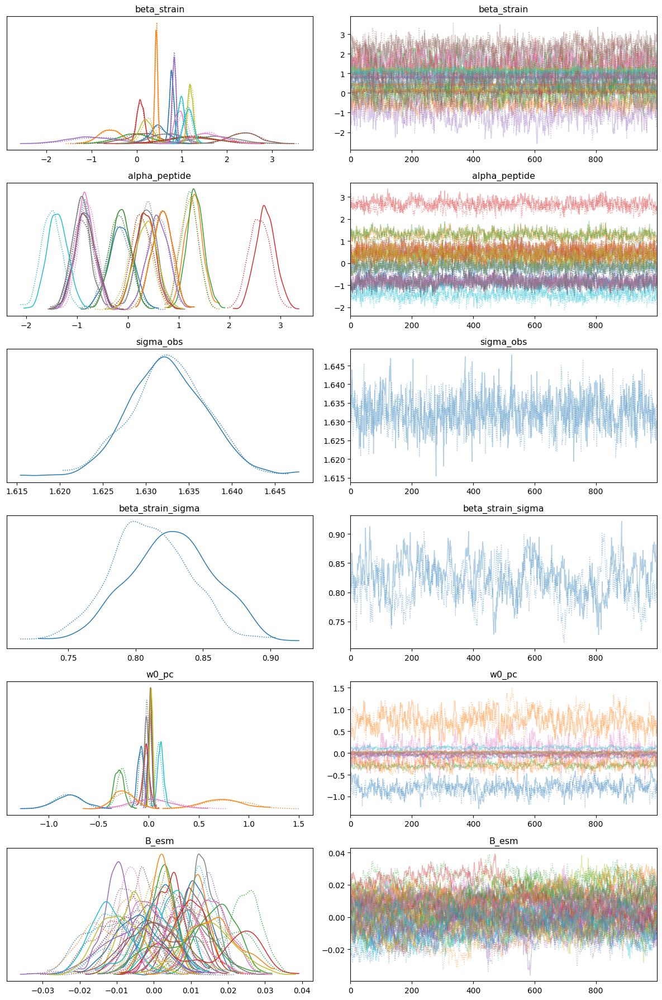

In [ ]:
idata = hpmf_model_wESMmixed_Hie.idata
peptide_list=train_df['Peptide ID'].unique()[:20]
species_list=train_df['Target Species'].unique()[:20]

# Always plot the global mean
var_names = []
coords = {}

if species_list is not None:
    var_names.append("beta_strain")
    # Convert string names to the integer indices used in the model
    coords["strain"] = [hpmf_model_wESMmixed_Hie.strain_dict[s] for s in species_list]

if peptide_list is not None:
    var_names.append("alpha_peptide")
    coords["peptide"] = [hpmf_model_wESMmixed_Hie.peptide_dict[p] for p in peptide_list]

var_names.append("sigma_obs")
var_names.append("beta_strain_sigma")
var_names.append("w0_pc")
var_names.append("B_esm")

coords["esm_interaction"] = np.arange(5)


# Plot using ArviZ
az.plot_trace(idata, var_names=var_names, coords=coords, figsize=(12, 3 * len(var_names)))
plt.tight_layout()
plt.show()

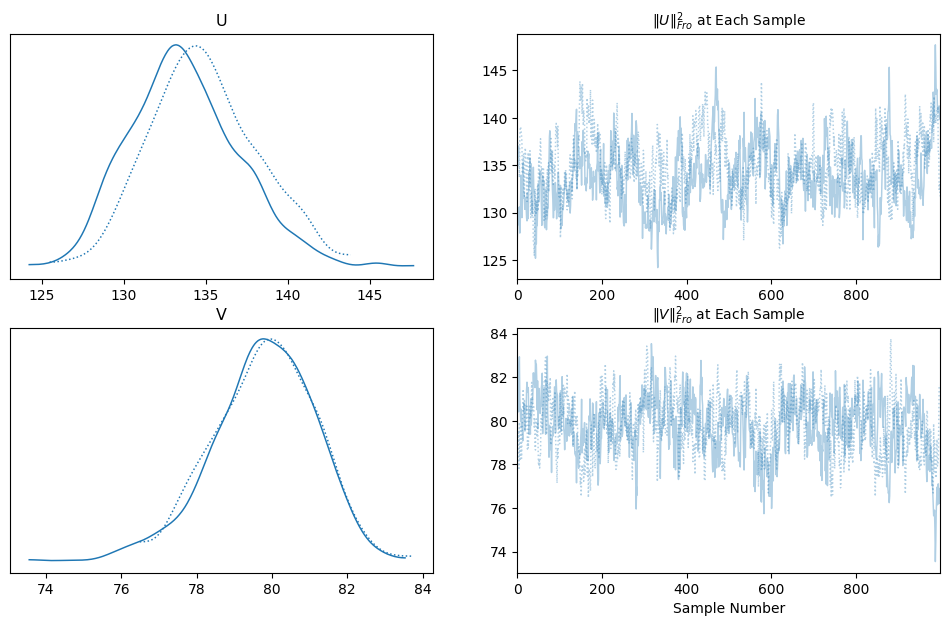

In [ ]:
hpmf_model_wESMmixed_Hie.traceplot()

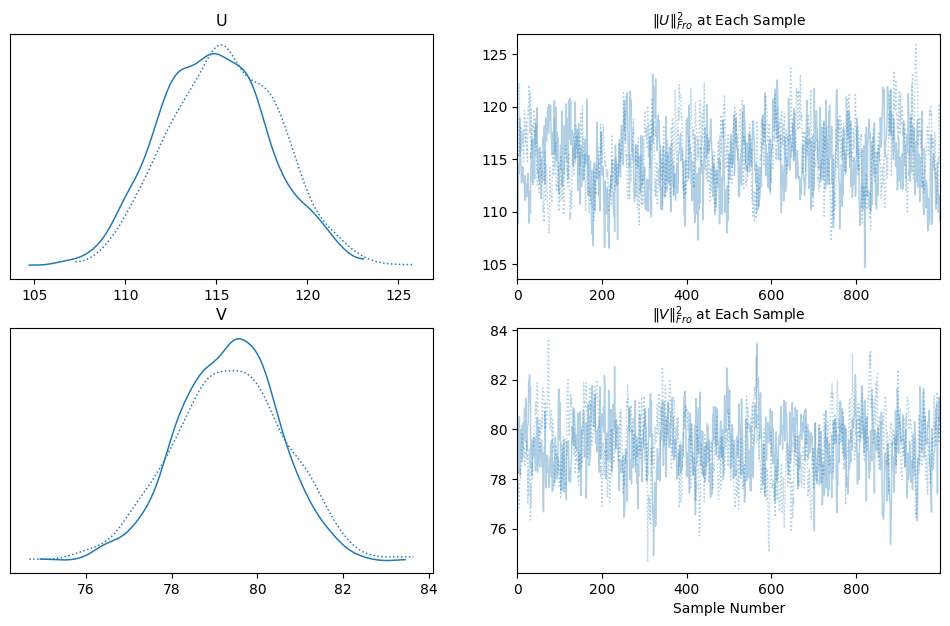

In [ ]:
hpmf_model_noESMU_Hie.traceplot()

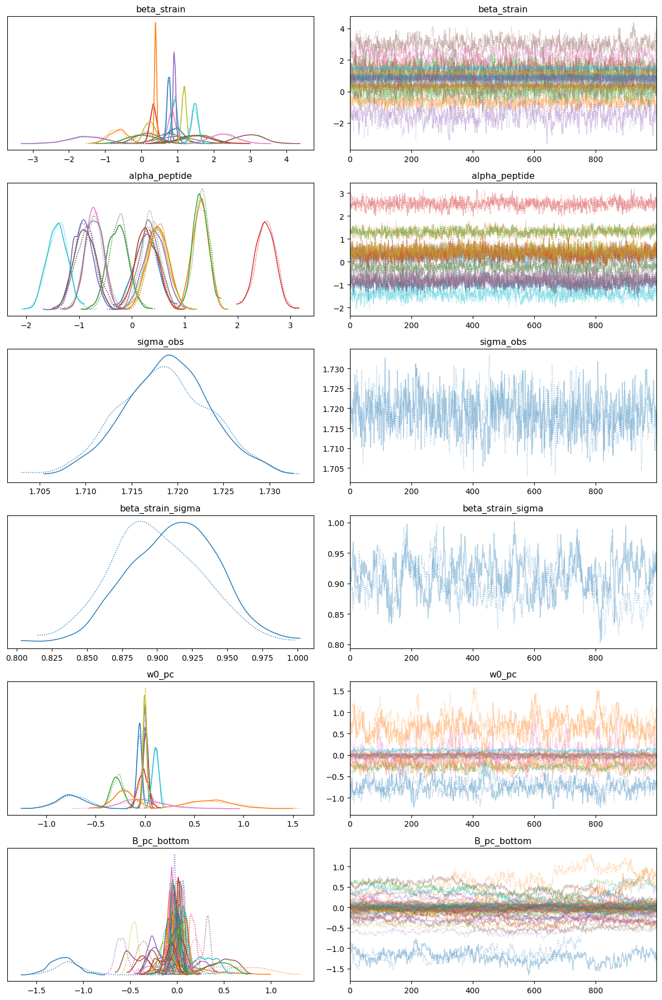

In [ ]:
idata = hpmf_model_noESMU_Hie.idata
peptide_list=train_df['Peptide ID'].unique()[:20]
species_list=train_df['Target Species'].unique()[:20]

# Always plot the global mean
var_names = []
coords = {}

if species_list is not None:
    var_names.append("beta_strain")
    # Convert string names to the integer indices used in the model
    coords["strain"] = [hpmf_model_noESMU_Hie.strain_dict[s] for s in species_list]

if peptide_list is not None:
    var_names.append("alpha_peptide")
    coords["peptide"] = [hpmf_model_noESMU_Hie.peptide_dict[p] for p in peptide_list]

var_names.append("sigma_obs")
var_names.append("beta_strain_sigma")
var_names.append("w0_pc")
var_names.append("B_pc_bottom")

coords["esm_intercept"] = np.arange(5)


# Plot using ArviZ
az.plot_trace(idata, var_names=var_names, coords=coords, figsize=(12, 3 * len(var_names)))
plt.tight_layout()
plt.show()

## Without Hierarchical

In [ ]:
hpmf_model_wESMmixed = Hybrid_PMF(train_df.copy(), phys_chem_norm.copy(), taxonomy_species,
                                 dim=6, horseshoe_u=False, horseshoe_intercept=True, non_centered=True,
                                 hierarchical=False, anchor_pc=True,
                                 esm_intercept=esm_input.copy(), esm_interaction=esm_pca_input.copy(),
                                 sigma_obs_sigma=3, beta_sigma=2,
                                 esm_active_num=15, slab_scale = 4.0)

hpmf_model_wESMmixed.draw_samples(draws=1000, tune=1500, nuts_sampler="numpyro", chains=2)
hpmf_model_wESMmixed.save(os.path.join(file_path, "saved_models", "hpmf_model_wESMmixed.6_1.gt_10_species"))

# idata = az.from_netcdf(os.path.join(file_path, "saved_models", "hpmf_model_wESMmixed.6_1.gt_10_species.nc"))
# hpmf_model_wESMmixed.idata = idata

/usr/local/lib/python3.12/dist-packages/pytensor/tensor/blas.py:1727: FutureWarning: batched_dot is deprecated. Use `dot` in conjunction with `tensor.vectorize` or `graph.replace.vectorize_graph`
  warnings.warn(
sample: 100%|██████████| 2500/2500 [32:08<00:00,  1.30it/s]
ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


In [ ]:

train_ESMmixed_out, test_ESMmixed_out, ESMmixed_performance = hpmf_model_wESMmixed.full_evaluation(hold_peptides_test)
ESMmixed_performance

Output()

/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Output()

Output()

Output()

{'rmse_train': np.float64(1.5998650038271989),
 'rmse_test': np.float64(2.2954257806323586),
 'elpd_train': np.float64(-149002.88095061795),
 'elpd_test': np.float64(-9002.923573578084)}

## Linear (w/o Interaction)

In [ ]:
hpmf_model_wESM_Hie_Linear = Hybrid_PMF(train_df.copy(), phys_chem_norm.copy(), taxonomy_species,
                                        horseshoe_u=False, horseshoe_intercept=True, non_centered=True,
                                        hierarchical=True, linreg=True, esm_intercept=esm_input.copy(),
                                        sigma_obs_sigma=3, beta_sigma=2,
                                        esm_active_num=15, slab_scale = 4.0)

hpmf_model_wESM_Hie_Linear.draw_samples(draws=1000, tune=1500, nuts_sampler="numpyro", chains=2)  # init="jitter+adapt_diag", n_init=50000,
hpmf_model_wESM_Hie_Linear.save(os.path.join(file_path, "saved_models", "hpmf_model_wESM_Hie_Linear.5_25.gt_10_species"))

# idata = az.from_netcdf(os.path.join(file_path, "saved_models", "hpmf_model_wESM_Hie_Linear.5_25.gt_10_species.nc"))
# hpmf_model_wESM_Hie_Linear.idata = idata

sample: 100%|██████████| 2500/2500 [23:09<00:00,  1.80it/s]
/usr/local/lib/python3.12/dist-packages/jax/_src/interpreters/mlir.py:1334: UserWarning: Some donated buffers were not usable: float64[2,1000,349].
See an explanation at https://docs.jax.dev/en/latest/faq.html#buffer-donation.
  warnings.warn("Some donated buffers were not usable:"
ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


In [ ]:
train_linear_out, test_linear_out, linear_performance = hpmf_model_wESM_Hie_Linear.full_evaluation(hold_peptides_test)
linear_performance

Output()

/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Output()

Output()

Output()

{'rmse_train': np.float64(1.8048019248307554),
 'rmse_test': np.float64(2.407013944950052),
 'elpd_train': np.float64(-154652.61914492646),
 'elpd_test': np.float64(-9218.682332484163)}

In [ ]:
pep_features = az.summary(hpmf_model_wESM_Hie_Linear.idata,
                          var_names=["w0_esm", "w0_pc"],
                          coords={'esm_intercept': np.random.choice(np.arange(1280), 100, replace=False)})
pep_features['type'] = pep_features.index.map(lambda x: x.split('[')[0])
pep_features.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)

/tmp/ipykernel_5138/3466549412.py:5: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  pep_features.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)


ess_bulk                 ess_tail                    r_hat           
type       w0_esm       w0_pc       w0_esm        w0_pc      w0_esm      w0_pc
count   100.00000   12.000000   100.000000    12.000000  100.000000  12.000000
mean    626.24000  426.750000  1003.560000   831.750000    1.001600   1.005000
std     182.82564  116.706411   409.229933   259.600436    0.003949   0.005222
min     264.00000  195.000000   121.000000   310.000000    1.000000   1.000000
25%     487.50000  399.500000   661.500000   796.000000    1.000000   1.000000
50%     623.00000  460.000000  1106.000000   902.000000    1.000000   1.005000
75%     740.50000  513.000000  1341.000000  1009.000000    1.000000   1.010000
max    1068.00000  544.000000  1692.000000  1067.000000    1.020000   1.010000

In [ ]:
intercepts = az.summary(hpmf_model_wESM_Hie_Linear.idata,
                        var_names=["alpha_peptide", "beta_genus", "beta_species", "beta_strain"],
                        coords={'peptide': np.random.choice(hpmf_model_wESM_Hie_Linear.model.coords["peptide"], 100, replace=False),
                                'genus': np.random.choice(hpmf_model_wESM_Hie_Linear.model.coords["genus"], 10, replace=False),
                                'species': np.random.choice(hpmf_model_wESM_Hie_Linear.model.coords["species"], 30, replace=False),
                                'strain': np.random.choice(hpmf_model_wESM_Hie_Linear.model.coords["strain"], 30, replace=False)})
intercepts['type'] = intercepts.index.map(lambda x: x.split('[')[0])
intercepts.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)

/tmp/ipykernel_5138/1946482760.py:8: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  intercepts.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)


ess_bulk                                           ess_tail  \
type  alpha_peptide beta_genus beta_species  beta_strain alpha_peptide   
count    100.000000   10.00000    30.000000    30.000000    100.000000   
mean    1030.370000  687.20000   482.566667  1365.366667   1566.040000   
std      192.667278   78.10648   218.264263   622.889179    201.011328   
min      550.000000  542.00000   169.000000   717.000000   1073.000000   
25%      900.500000  670.75000   307.250000   924.750000   1413.250000   
50%     1022.000000  697.00000   423.500000  1054.000000   1604.000000   
75%     1147.500000  716.00000   688.500000  1863.750000   1721.000000   
max     1542.000000  804.00000   847.000000  3058.000000   1940.000000   

                                                     r_hat             \
type    beta_genus beta_species  beta_strain alpha_peptide beta_genus   
count    10.000000     30.00000    30.000000      100.0000  10.000000   
mean    931.900000    784.20000  1313.000000        1.0001   1.002000   
std     157.369664    239.47261   235.494637        0.0010   0.004216   
min     738.000000    336.00000   864.000000        1.0000   1.000000   
25%     789.750000    623.75000  1149.500000        1.0000   1.000000   
50%     915.000000    802.50000  1327.000000        1.0000   1.000000   
75%    1038.750000    960.50000  1439.500000        1.0000   1.000000   
max    1208.000000   1267.00000  1789.000000        1.0100   1.010000   

                                
type  beta_species beta_strain  
count    30.000000        30.0  
mean      1.005000         1.0  
std       0.007311         0.0  
min       1.000000         1.0  
25%       1.000000         1.0  
50%       1.000000         1.0  
75%       1.010000         1.0  
max       1.030000         1.0

In [ ]:
az.summary(hpmf_model_wESM_Hie_Linear.idata,
           var_names=["sigma_obs", "beta_genus_sigma", "beta_species_sigma", "beta_strain_sigma", "w0_pc_sigma"])[['ess_bulk','ess_tail','r_hat']]

,ess_bulk,ess_tail,r_hat
sigma_obs,1060.0,1368.0,1.00
beta_genus_sigma,72.0,132.0,1.02
beta_species_sigma,23.0,133.0,1.08
beta_strain_sigma,111.0,231.0,1.04
w0_pc_sigma,307.0,594.0,1.01


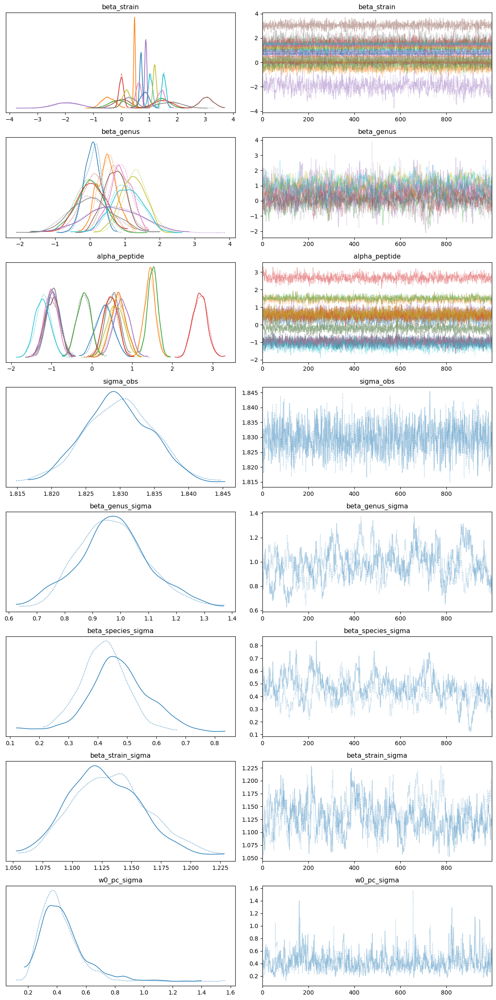

In [ ]:
idata = hpmf_model_wESM_Hie_Linear.idata
peptide_list=train_df['Peptide ID'].unique()[:20]
species_list=train_df['Target Species'].unique()[:20]
genus_list=taxonomy_species[taxonomy_species['Target Species'].isin(train_df['Target Species'])]['genus'].unique()[:10]

# Always plot the global mean
var_names = []
coords = {}

if species_list is not None:
    var_names.append("beta_strain")
    # Convert string names to the integer indices used in the model
    coords["strain"] = [hpmf_model_wESM_Hie_Linear.strain_dict[s] for s in species_list]
if genus_list is not None:
    var_names.append("beta_genus")
    # Convert string names to the integer indices used in the model
    coords["genus"] = [hpmf_model_wESM_Hie_Linear.genus_dict[s] for s in genus_list]

if peptide_list is not None:
    var_names.append("alpha_peptide")
    coords["peptide"] = [hpmf_model_wESM_Hie_Linear.peptide_dict[p] for p in peptide_list]

var_names.append("sigma_obs")
var_names.append("beta_genus_sigma")
var_names.append("beta_species_sigma")
var_names.append("beta_strain_sigma")
var_names.append("w0_pc_sigma")

# Plot using ArviZ
az.plot_trace(idata, var_names=var_names, coords=coords, figsize=(12, 3 * len(var_names)))
plt.tight_layout()
plt.show()

## Without ESM

In [ ]:
hpmf_model_noESM_Hie = Hybrid_PMF(train_df.copy(), phys_chem_norm.copy(), taxonomy_species,
                                  dim=6, horseshoe_u=False, horseshoe_intercept=False, non_centered=True,
                                 hierarchical=True, anchor_pc=True,
                                 esm_intercept=None, esm_interaction=None,
                                 sigma_obs_sigma=3, beta_sigma=2)
# horseshoe, slab, etc. shouldn't matter without ESM

# hpmf_model_noESM_Hie.draw_samples(draws=1000, tune=1500, nuts_sampler="numpyro", chains=2)  # init="jitter+adapt_diag", n_init=50000,
# hpmf_model_noESM_Hie.save(os.path.join(file_path, "saved_models", "hpmf_model_noESM_Hie.anchor_pc.5_25.gt_10_species"))

idata = az.from_netcdf(os.path.join(file_path, "saved_models", "hpmf_model_noESM_Hie.anchor_pc.5_25.gt_10_species.nc"))
hpmf_model_noESM_Hie.idata = idata

/usr/local/lib/python3.12/dist-packages/pytensor/tensor/blas.py:1727: FutureWarning: batched_dot is deprecated. Use `dot` in conjunction with `tensor.vectorize` or `graph.replace.vectorize_graph`
  warnings.warn(


In [ ]:
train_noESM_Hie_out, test_noESM_Hie_out, noESM_Hie_performance = hpmf_model_noESM_Hie.full_evaluation(hold_peptides_test)
noESM_Hie_performance

{'rmse_train': np.float64(1.9435045768708776),
 'rmse_test': np.float64(2.188729864841133),
 'elpd_train': np.float64(-159320.9196803198),
 'elpd_test': np.float64(-8704.337363382188)}

In [ ]:
pep_features = az.summary(hpmf_model_noESM_Hie.idata,
                          var_names=["w0_pc", "B_pc_raw", "B_pc_anchors"])
pep_features['type'] = pep_features.index.map(lambda x: x.split('[')[0])
pep_features.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)

/tmp/ipykernel_2796/3983000590.py:4: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  pep_features.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)


ess_bulk                               ess_tail               \
type  B_pc_anchors     B_pc_raw        w0_pc B_pc_anchors     B_pc_raw   
count     6.000000    72.000000    12.000000     6.000000    72.000000   
mean     25.000000   319.402778   973.416667    63.500000   168.513889   
std       6.033241  1039.554572   211.207980    16.208023   407.083858   
min      18.000000     4.000000   707.000000    45.000000    12.000000   
25%      19.500000     6.000000   827.750000    48.750000    31.000000   
50%      26.000000    11.000000   875.000000    65.500000    47.000000   
75%      29.500000    16.250000  1089.500000    77.750000    70.500000   
max      32.000000  4532.000000  1360.000000    80.000000  1587.000000   

                          r_hat                   
type         w0_pc B_pc_anchors   B_pc_raw w0_pc  
count    12.000000     6.000000  72.000000  12.0  
mean   1296.583333     1.073333   1.184167   1.0  
std     188.034068     0.021602   0.114286   0.0  
min     954.000000     1.040000   1.000000   1.0  
25%    1266.250000     1.062500   1.107500   1.0  
50%    1296.000000     1.075000   1.170000   1.0  
75%    1370.500000     1.087500   1.272500   1.0  
max    1637.000000     1.100000   1.410000   1.0

In [ ]:
hpmf_model_noESM_Hie.idata.posterior.B_pc_anchors.mean(("chain", "draw")).values

array([0.17669026, 0.55954201, 0.23902624, 0.26932127, 0.09964311,
       0.10291749])

In [ ]:
intercepts_interactions = az.summary(hpmf_model_noESM_Hie.idata,
                        var_names=["alpha_peptide", "beta_genus", "beta_species", "beta_strain",
                                   "U", "V_genus", "V_species", "V_strains"],
                        coords={'peptide': np.random.choice(hpmf_model_noESM_Hie.model.coords["peptide"], 100, replace=False),
                                'genus': np.random.choice(hpmf_model_noESM_Hie.model.coords["genus"], 10, replace=False),
                                'species': np.random.choice(hpmf_model_noESM_Hie.model.coords["species"], 30, replace=False),
                                'strain': np.random.choice(hpmf_model_noESM_Hie.model.coords["strain"], 30, replace=False)})
intercepts_interactions['type'] = intercepts_interactions.index.map(lambda x: x.split('[')[0])
intercepts_interactions.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)

/tmp/ipykernel_2796/3574533758.py:9: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  intercepts_interactions.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)


ess_bulk                                                       \
type            U      V_genus    V_species    V_strains alpha_peptide   
count  600.000000    60.000000   180.000000   180.000000    100.000000   
mean    12.293333  3484.700000  2346.666667   125.394444   1161.060000   
std      7.679773  1276.947875  1701.613927   299.776835    259.913382   
min      3.000000     6.000000    13.000000     4.000000    669.000000   
25%      6.000000  3282.250000   455.500000    19.000000    923.000000   
50%     10.000000  3771.500000  2592.000000    42.500000   1177.000000   
75%     17.000000  4191.500000  3855.000000    87.750000   1361.750000   
max     51.000000  5098.000000  5387.000000  2243.000000   1812.000000   

                                                ess_tail               ...  \
type    beta_genus beta_species  beta_strain           U      V_genus  ...   
count    10.000000     30.00000    30.000000  600.000000    60.000000  ...   
mean   2688.100000   2245.90000  2856.533333   40.211667  1222.233333  ...   
std     870.943862    868.15275   577.676782   21.185094   351.581481  ...   
min     747.000000    391.00000  2058.000000   11.000000    95.000000  ...   
25%    2264.500000   1607.50000  2521.250000   23.000000  1215.500000  ...   
50%    2980.000000   2020.00000  2763.500000   35.000000  1312.000000  ...   
75%    3170.500000   2954.25000  3030.500000   54.000000  1356.500000  ...   
max    3846.000000   3901.00000  4979.000000  117.000000  1655.000000  ...   

                                      r_hat                         \
type  beta_species  beta_strain           U    V_genus   V_species   
count    30.000000    30.000000  600.000000  60.000000  180.000000   
mean   1381.000000  1591.200000    1.201883   1.010333    1.008278   
std     201.415508   161.964108    0.130380   0.035174    0.017619   
min     739.000000  1203.000000    1.010000   1.000000    1.000000   
25%    1296.750000  1517.750000    1.100000   1.000000    1.000000   
50%    1361.500000  1600.000000    1.170000   1.000000    1.000000   
75%    1493.750000  1690.250000    1.270000   1.010000    1.010000   
max    1768.000000  1863.000000    1.710000   1.260000    1.100000   

                                                                     
type    V_strains alpha_peptide beta_genus beta_species beta_strain  
count  180.000000         100.0  10.000000    30.000000   30.000000  
mean     1.059111           1.0   1.002000     1.001000    1.000333  
std      0.066880           0.0   0.004216     0.003051    0.001826  
min      1.000000           1.0   1.000000     1.000000    1.000000  
25%      1.020000           1.0   1.000000     1.000000    1.000000  
50%      1.040000           1.0   1.000000     1.000000    1.000000  
75%      1.072500           1.0   1.000000     1.000000    1.000000  
max      1.380000           1.0   1.010000     1.010000    1.010000  

[8 rows x 24 columns]

In [ ]:
intercepts_interactions[(intercepts_interactions['type'] == 'U') &
                              (intercepts_interactions['r_hat'] > 1.05)].index.map(lambda x: x[-2]).value_counts()


,count
2,95
4,94
0,94
5,92
1,91
3,89


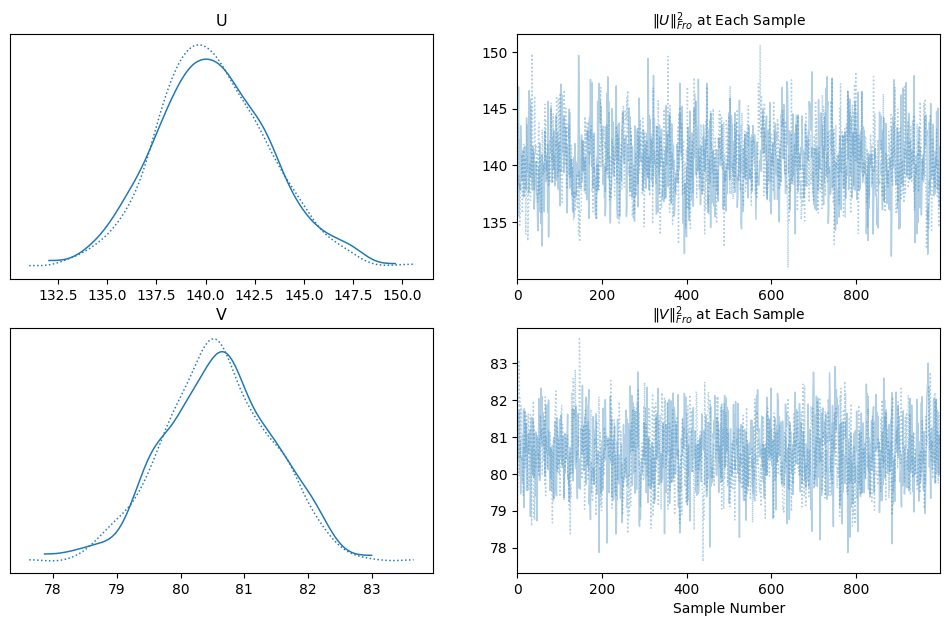

In [ ]:
hpmf_model_noESM_Hie.traceplot()

### Old one, with the rotation fixed.
It was a lot better, but it just did so bad when I added the ESM features back in.

In [ ]:
hpmf_model_noESM_Hie.idata.posterior.B_pc_diag.mean(("chain", "draw")).values

array([0.35604453, 1.15065749, 0.62609771, 0.46928126, 0.06299631,
       0.11104202])

In [ ]:
pep_features = az.summary(hpmf_model_noESM_Hie.idata,
                          var_names=["w0_pc", "B_pc", "B_pc_lower", "B_pc_diag", "B_pc_bottom"])
pep_features['type'] = pep_features.index.map(lambda x: x.split('[')[0])
pep_features.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)

/tmp/ipykernel_10291/1021220457.py:4: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  pep_features.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)


ess_bulk                                                   \
type          B_pc B_pc_bottom   B_pc_diag  B_pc_lower        w0_pc   
count    72.000000   36.000000    6.000000   15.000000    12.000000   
mean   3466.958333  321.388889  340.500000  304.200000  1001.083333   
std     369.797754  234.016395  235.532376  187.816856   237.677191   
min    2608.000000   10.000000   10.000000   29.000000   548.000000   
25%    3214.000000  154.500000  183.750000  215.500000   825.500000   
50%    3486.000000  286.000000  419.500000  278.000000  1022.000000   
75%    3623.500000  485.750000  439.250000  356.500000  1186.750000   
max    4592.000000  877.000000  643.000000  697.000000  1359.000000   

          ess_tail                                                     \
type          B_pc  B_pc_bottom    B_pc_diag   B_pc_lower       w0_pc   
count    72.000000    36.000000     6.000000    15.000000    12.00000   
mean   1343.569444   590.888889   723.333333   628.066667  1225.75000   
std     124.505990   383.079535   372.928769   250.684340   208.27304   
min    1066.000000    48.000000   167.000000    79.000000   992.00000   
25%    1264.750000   292.250000   556.250000   497.500000  1089.25000   
50%    1361.500000   512.500000   695.500000   607.000000  1140.50000   
75%    1433.000000   848.250000   976.500000   734.000000  1361.50000   
max    1662.000000  1481.000000  1202.000000  1117.000000  1598.00000   

           r_hat                                         
type        B_pc B_pc_bottom B_pc_diag B_pc_lower w0_pc  
count  72.000000   36.000000  6.000000  15.000000  12.0  
mean    1.000139    1.027500  1.035000   1.016667   1.0  
std     0.001179    0.043053  0.063166   0.018387   0.0  
min     1.000000    1.000000  1.000000   1.000000   1.0  
25%     1.000000    1.000000  1.000000   1.010000   1.0  
50%     1.000000    1.010000  1.005000   1.010000   1.0  
75%     1.000000    1.020000  1.032500   1.020000   1.0  
max     1.010000    1.150000  1.160000   1.070000   1.0

In [ ]:
intercepts_interactions = az.summary(hpmf_model_noESM_Hie.idata,
                        var_names=["alpha_peptide", "beta_genus", "beta_species", "beta_strain",
                                   "U", "V_genus", "V_species", "V_strains"],
                        coords={'peptide': np.random.choice(hpmf_model_noESM_Hie.model.coords["peptide"], 100, replace=False),
                                'genus': np.random.choice(hpmf_model_noESM_Hie.model.coords["genus"], 10, replace=False),
                                'species': np.random.choice(hpmf_model_noESM_Hie.model.coords["species"], 30, replace=False),
                                'strain': np.random.choice(hpmf_model_noESM_Hie.model.coords["strain"], 30, replace=False)})
intercepts_interactions['type'] = intercepts_interactions.index.map(lambda x: x.split('[')[0])
intercepts_interactions.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)

/tmp/ipykernel_10291/1556879136.py:9: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  intercepts_interactions.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)


ess_bulk                                                       \
type            U      V_genus    V_species    V_strains alpha_peptide   
count  600.000000    60.000000   180.000000   180.000000    100.000000   
mean   254.790000  2801.866667  3243.616667  2390.327778   1203.860000   
std    162.470285   323.987522   658.044362   830.206462    243.737855   
min      8.000000  1817.000000    27.000000    35.000000    626.000000   
25%    108.000000  2578.500000  2988.000000  1929.000000   1025.250000   
50%    284.000000  2790.500000  3295.500000  2554.000000   1225.000000   
75%    367.500000  3070.000000  3597.500000  2943.750000   1398.250000   
max    805.000000  3480.000000  4707.000000  4191.000000   1771.000000   

                                                 ess_tail               ...  \
type    beta_genus beta_species  beta_strain            U      V_genus  ...   
count    10.000000    30.000000    30.000000   600.000000    60.000000  ...   
mean   3407.200000  2771.333333  2635.666667   537.951667   344.716667  ...   
std     776.462606   960.310127   465.268208   293.464316   206.096908  ...   
min    1956.000000   448.000000  1187.000000    39.000000    79.000000  ...   
25%    3060.500000  2074.000000  2405.750000   297.000000   186.000000  ...   
50%    3717.000000  2661.000000  2688.000000   553.500000   311.000000  ...   
75%    3897.250000  3636.000000  2873.750000   763.500000   420.000000  ...   
max    4150.000000  4380.000000  3546.000000  1364.000000  1006.000000  ...   

                                      r_hat                         \
type  beta_species  beta_strain           U    V_genus   V_species   
count    30.000000    30.000000  600.000000  60.000000  180.000000   
mean   1381.266667  1525.500000    1.032867   1.045500    1.000889   
std     249.327085   170.591618    0.048145   0.013203    0.004990   
min     737.000000  1245.000000    1.000000   1.010000    1.000000   
25%    1280.000000  1401.250000    1.000000   1.040000    1.000000   
50%    1382.500000  1493.000000    1.010000   1.045000    1.000000   
75%    1604.750000  1669.500000    1.040000   1.052500    1.000000   
max    1729.000000  1874.000000    1.190000   1.070000    1.060000   

                                                                     
type    V_strains alpha_peptide beta_genus beta_species beta_strain  
count  180.000000     100.00000  10.000000    30.000000   30.000000  
mean     1.001444       1.00050   1.001000     1.001333    1.000333  
std      0.005083       0.00219   0.003162     0.003457    0.001826  
min      1.000000       1.00000   1.000000     1.000000    1.000000  
25%      1.000000       1.00000   1.000000     1.000000    1.000000  
50%      1.000000       1.00000   1.000000     1.000000    1.000000  
75%      1.000000       1.00000   1.000000     1.000000    1.000000  
max      1.040000       1.01000   1.010000     1.010000    1.010000  

[8 rows x 24 columns]

In [ ]:
intercepts_interactions[(intercepts_interactions['type'] == 'U') &
                              (intercepts_interactions['r_hat'] > 1.05)].index.map(lambda x: x[-2]).value_counts()


,count
5,62
4,62


All the high R_hat are in the 4/5 latent dimensions, which don't seem to be useful based on the above analysis. But if I add the ESM features back in, it will probably be useful.

I don't actually care as much about the U, because it is per peptide and there is not a lot of information per peptide. The underlying B_pc (and B_esm) are more important. But those also were not learned well!

I tried again with anchoring the PC (for both sign and rotational invariance). It is better, though the U and Vs are still not perfect.

In [ ]:
az.summary(hpmf_model_noESM_Hie.idata,
           var_names=["sigma_obs", "beta_genus_sigma", "beta_species_sigma", "beta_strain_sigma"])[['ess_bulk','ess_tail','r_hat']]

,ess_bulk,ess_tail,r_hat
sigma_obs,2503.0,1247.0,1.01
beta_genus_sigma,288.0,592.0,1.00
beta_species_sigma,283.0,399.0,1.01
beta_strain_sigma,832.0,1263.0,1.00


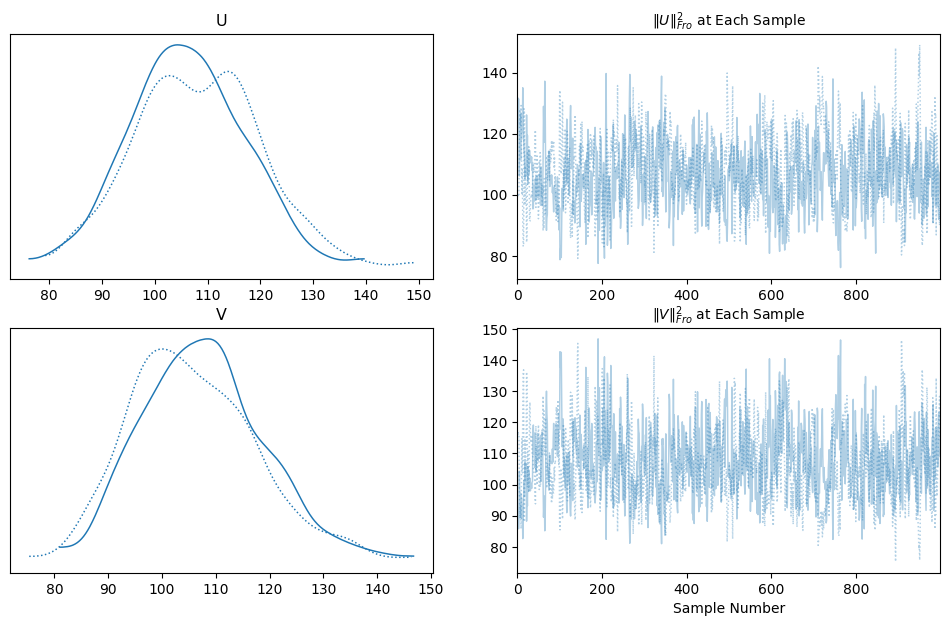

In [ ]:
hpmf_model_noESM_Hie.traceplot()

In [ ]:
train_noESM_out, test_noESM_out, noESM_performance = hpmf_model_noESM_Hie.full_evaluation(hold_peptides_test)

Output()

/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Output()

Output()

Output()

In [ ]:
noESM_performance

{'rmse_train': np.float64(1.9432582706855215),
 'rmse_test': np.float64(2.1868316158934253),
 'elpd_train': np.float64(-161547.05511819752),
 'elpd_test': np.float64(-8708.931729234642)}

In [ ]:
test_noESM_out

,Peptide ID,Peptide Sequence,Target Species,Activity Measure,Activity,Unit,pH,Ionic Strength mM,"""Salt Type""",Medium,...,range,censored_high,num_X_O,MW,Activity_uM,Activity_low_uM,mic,mic_transformed,elpd,error
489,4438,GAPKGCWTKSYPPKPCK,Escherichia coli NCTC 10418,MIC,160.0,µM,NaN,NaN,NaN,MHB,...,False,False,0,1848.1959,160.000000,80.000000,7.321928,1.455862,-2.081845,1.180320
567,4456,HSDAVFTDNYTRLRKQMAVKKYLNSILN,Escherichia coli ATCC 25922,MIC,5.2,µg/ml,NaN,NaN,NaN,MHB,...,False,False,0,3326.7815,1.563072,0.781536,0.644385,-1.140579,-2.970193,-2.817344
568,4456,HSDAVFTDNYTRLRKQMAVKKYLNSILN,Enterococcus faecalis NCTC 12697,MIC,500.0,µg/ml,NaN,NaN,NaN,MHB,...,False,True,0,3326.7815,150.295413,150.295413,7.231657,1.420762,-1.964338,1.160349
569,4456,HSDAVFTDNYTRLRKQMAVKKYLNSILN,Pseudomonas aeruginosa ATCC 27853,MIC,4.1,µg/ml,NaN,NaN,NaN,MHB,...,False,False,0,3326.7815,1.232422,0.616211,0.301497,-1.273904,-3.702254,-4.288849
570,4456,HSDAVFTDNYTRLRKQMAVKKYLNSILN,Staphylococcus aureus ATCC 25923,MIC,500.0,µg/ml,NaN,NaN,NaN,MHB,...,False,True,0,3326.7815,150.295413,150.295413,7.231657,1.420762,-3.186901,3.184910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119145,4336,LVKRFKKFFRKLKKSVK,Staphylococcus aureus,MIC,128.0,µg/ml,NaN,NaN,NaN,MHB,...,False,False,0,2180.7687,58.694900,29.347450,5.875163,0.893314,-2.931219,2.646831
119146,4336,LVKRFKKFFRKLKKSVK,Pseudomonas aeruginosa,MIC,4.0,µg/ml,NaN,NaN,NaN,MHB,...,False,False,0,2180.7687,1.834216,0.917108,0.875163,-1.050845,-2.847921,-2.430546
119147,4336,LVKRFKKFFRKLKKSVK,Salmonella enterica subsp. enterica serovar Typhi,MIC,2.0,µg/ml,NaN,NaN,NaN,MHB,...,False,False,0,2180.7687,0.917108,0.458554,-0.124837,-1.439676,-2.391199,-1.758547
119148,4336,LVKRFKKFFRKLKKSVK,Bacillus subtilis,MIC,32.0,µg/ml,NaN,NaN,NaN,MHB,...,False,False,0,2180.7687,14.673725,7.336862,3.875163,0.115650,-2.390300,1.722544


## Random Effects (w/o Hybrid PMF)

In [ ]:
hpmf_model_wESM_Hie_RandomEffects = Hybrid_PMF(train_df.copy(), phys_chem_norm.copy(), taxonomy_species,
                                              horseshoe_u=False, horseshoe_intercept=True, non_centered=True, random_effects=True,
                                              hierarchical=True, esm_intercept=esm_input.copy(), esm_interaction=None,
                                              sigma_obs_sigma=3, beta_sigma=2,
                                              esm_active_num=15, slab_scale = 4.0)

# hpmf_model_wESM_Hie_RandomEffects.draw_samples(draws=1000, tune=1500, nuts_sampler="numpyro", chains=2)  # init="jitter+adapt_diag", n_init=50000,
# hpmf_model_wESM_Hie_RandomEffects.save(os.path.join(file_path, "saved_models", "hpmf_model_wESM_Hie_RandomEffects.5_25.gt_10_species"))

idata = az.from_netcdf(os.path.join(file_path, "saved_models", "hpmf_model_wESM_Hie_RandomEffects.5_25.gt_10_species.nc"))
hpmf_model_wESM_Hie_RandomEffects.idata = idata

/usr/local/lib/python3.12/dist-packages/pytensor/tensor/blas.py:1727: FutureWarning: batched_dot is deprecated. Use `dot` in conjunction with `tensor.vectorize` or `graph.replace.vectorize_graph`
  warnings.warn(


In [ ]:
hpmf_model_wESM_Hie_RandomEffects.idata.posterior

<xarray.Dataset> Size: 6GB
Dimensions:             (chain: 2, draw: 1000, peptide: 11987,
                         latent_factor: 10, genus: 350, species: 791,
                         strain: 1093, esm_intercept: 1280, obs_id: 75904,
                         var_fracs_dim_0: 3, phys_chem: 12)
Coordinates:
  * chain               (chain) int64 16B 0 1
  * draw                (draw) int64 8kB 0 1 2 3 4 5 ... 994 995 996 997 998 999
  * peptide             (peptide) int64 96kB 0 1 2 3 ... 11983 11984 11985 11986
  * latent_factor       (latent_factor) int64 80B 0 1 2 3 4 5 6 7 8 9
  * genus               (genus) int64 3kB 0 1 2 3 4 5 ... 345 346 347 348 349
  * species             (species) int64 6kB 0 1 2 3 4 5 ... 786 787 788 789 790
  * strain              (strain) int64 9kB 0 1 2 3 4 ... 1089 1090 1091 1092
  * esm_intercept       (esm_intercept) int64 10kB 0 1 2 3 ... 1277 1278 1279
  * obs_id              (obs_id) int64 607kB 0 1 2 3 ... 75900 75901 75902 75903
  * var_fracs_dim_0     (var_fracs_dim_0) int64 24B 0 1 2
  * phys_chem           (phys_chem) int64 96B 0 1 2 3 4 5 6 7 8 9 10 11
Data variables: (12/31)
    U                   (chain, draw, peptide, latent_factor) float64 2GB ...
    U_raw               (chain, draw, peptide, latent_factor) float64 2GB ...
    V_genus             (chain, draw, genus, latent_factor) float64 56MB ...
    V_genus_raw         (chain, draw, genus, latent_factor) float64 56MB ...
    V_species           (chain, draw, species, latent_factor) float64 127MB ...
    V_species_raw       (chain, draw, species, latent_factor) float64 127MB ...
    ...                  ...
    sigma_u             (chain, draw) float64 16kB ...
    tau_esm_int         (chain, draw) float64 16kB ...
    var_fracs           (chain, draw, var_fracs_dim_0) float64 48kB ...
    w0_esm              (chain, draw, esm_intercept) float64 20MB ...
    w0_pc               (chain, draw, phys_chem) float64 192kB ...
    w0_pc_sigma         (chain, draw) float64 16kB ...
Attributes:
    created_at:                 2026-05-26T05:35:41.066929+00:00
    arviz_version:              0.22.0
    inference_library:          numpyro
    inference_library_version:  0.21.0
    sampling_time:              3275.391519
    tuning_steps:               1500

In [ ]:
test_elpd, test_elpd_point = hpmf_model_wESM_Hie_RandomEffects.get_elpd_test(hold_peptides_test.iloc[:100])

Output()

KeyError: "No variable named 'mu_obs'. Did you mean one of ('MIC_obs',)?"

In [ ]:
train_random_effects_out, test_random_effects_out, random_effects_performance = hpmf_model_wESM_Hie_RandomEffects.full_evaluation(hold_peptides_test)
noESM_Hie_performance

In [ ]:
# Using KNN=10
train_random_effects_out, test_random_effects_out, random_effects_performance = hpmf_model_wESM_Hie_RandomEffects.full_evaluation(hold_peptides_test, compute_elpd=False)
random_effects_performance

Output()

Output()

{'rmse_train': np.float64(0.7704444078929167),
 'rmse_test': np.float64(2.4081761829401245)}

In [ ]:
train_random_effects_out, test_random_effects_out, random_effects_performance = hpmf_model_wESM_Hie_RandomEffects.full_evaluation(hold_peptides_test, new_peptide_method='mean', compute_elpd=False)
random_effects_performance

Output()

Output()

{'rmse_train': np.float64(0.7702103074265604),
 'rmse_test': np.float64(2.409778512699736)}

In [ ]:
train_random_effects_out, test_random_effects_out, random_effects_performance = hpmf_model_wESM_Hie_RandomEffects.full_evaluation(hold_peptides_test, k=1, compute_elpd=False)
random_effects_performance

Output()

Output()

{'rmse_train': np.float64(0.7702575531792089),
 'rmse_test': np.float64(2.4138541870731043)}

Does not change the results at all. I am a little skeptical of this (I should make sure the KNN and gen_U code is working), but it could just mean that the interaction terms aren't really learning anything useful. It is overfitting on the learned U's but they don't actually carry that much useful information in general.

It would be most interesting to see how the cross-species predictions do (but I actually filter most of these out of the dataset by only doing the peptide_hold_out set).

In [ ]:
pep_features = az.summary(hpmf_model_wESM_Hie_RandomEffects.idata,
                          var_names=["w0_esm", "w0_pc"],
                          coords={'esm_intercept': np.random.choice(np.arange(1280), 100, replace=False)})
pep_features['type'] = pep_features.index.map(lambda x: x.split('[')[0])
pep_features.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)

/tmp/ipykernel_2299/1989758799.py:5: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  pep_features.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)


ess_bulk                ess_tail                   r_hat           
type       w0_esm       w0_pc      w0_esm       w0_pc      w0_esm      w0_pc
count  100.000000   12.000000  100.000000   12.000000  100.000000  12.000000
mean    95.030000   62.083333  189.180000  120.916667    1.032600   1.028333
std     45.958579   21.377381   86.288731   34.487042    0.029219   0.015275
min     10.000000   30.000000   17.000000   51.000000    1.000000   1.020000
25%     58.750000   48.000000  119.250000   96.750000    1.010000   1.020000
50%     97.000000   62.000000  186.000000  130.500000    1.020000   1.020000
75%    133.250000   72.250000  239.250000  141.750000    1.040000   1.032500
max    210.000000  102.000000  411.000000  170.000000    1.160000   1.070000

In [ ]:
intercepts_interactions = az.summary(hpmf_model_wESM_Hie_RandomEffects.idata,
                        var_names=["alpha_peptide", "beta_genus", "beta_species", "beta_strain",
                                   "U", "V_genus", "V_species", "V_strains"],
                        coords={'peptide': np.random.choice(hpmf_model_wESM_Hie_RandomEffects.model.coords["peptide"], 100, replace=False),
                                'genus': np.random.choice(hpmf_model_wESM_Hie_RandomEffects.model.coords["genus"], 10, replace=False),
                                'species': np.random.choice(hpmf_model_wESM_Hie_RandomEffects.model.coords["species"], 30, replace=False),
                                'strain': np.random.choice(hpmf_model_wESM_Hie_RandomEffects.model.coords["strain"], 30, replace=False)})
intercepts_interactions['type'] = intercepts_interactions.index.map(lambda x: x.split('[')[0])
intercepts_interactions.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)

/tmp/ipykernel_2299/3520097644.py:9: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  intercepts_interactions.groupby('type')[['ess_bulk','ess_tail','r_hat']].describe().stack().unstack(0)


ess_bulk                                                    \
type             U     V_genus   V_species   V_strains alpha_peptide   
count  1000.000000  100.000000  300.000000  300.000000     100.00000   
mean     82.944000   79.940000   61.636667   10.753333      70.09000   
std      59.573046   68.406069   68.041189   17.889081      26.97552   
min       3.000000    2.000000    2.000000    2.000000      10.00000   
25%      19.000000    8.000000    4.000000    3.000000      51.50000   
50%      88.000000   88.000000   16.500000    4.000000      67.00000   
75%     134.000000  135.750000  130.000000    8.000000      91.00000   
max     223.000000  248.000000  221.000000  123.000000     149.00000   

                                              ess_tail              ...  \
type   beta_genus beta_species beta_strain           U     V_genus  ...   
count   10.000000    30.000000   30.000000  1000.00000  100.000000  ...   
mean   116.400000   112.166667  117.466667   222.48100  204.850000  ...   
std     31.812646    44.028269   45.131787    97.36713  118.261171  ...   
min     79.000000    48.000000   15.000000    14.00000   12.000000  ...   
25%     94.750000    78.500000   93.000000   156.00000  115.000000  ...   
50%    113.500000   105.500000  119.000000   230.50000  185.500000  ...   
75%    135.750000   140.750000  139.750000   292.00000  297.000000  ...   
max    181.000000   195.000000  224.000000   501.00000  459.000000  ...   

                                      r_hat                          \
type  beta_species beta_strain            U     V_genus   V_species   
count    30.000000   30.000000  1000.000000  100.000000  300.000000   
mean    253.933333  296.866667     1.100310    1.160600    1.294000   
std      85.744582   94.845331     0.152562    0.260384    0.358171   
min      86.000000  161.000000     1.000000    1.000000    1.000000   
25%     177.000000  216.000000     1.020000    1.010000    1.020000   
50%     260.500000  286.000000     1.040000    1.030000    1.115000   
75%     318.250000  370.750000     1.100000    1.192500    1.522500   
max     437.000000  561.000000     2.050000    2.350000    2.380000   

                                                                     
type    V_strains alpha_peptide beta_genus beta_species beta_strain  
count  300.000000     100.00000  10.000000     30.00000   30.000000  
mean     1.538700       1.03440   1.020000      1.01900    1.023000  
std      0.371971       0.02826   0.008165      0.01269    0.021995  
min      1.010000       1.00000   1.010000      1.00000    1.000000  
25%      1.197500       1.02000   1.012500      1.01000    1.010000  
50%      1.495000       1.03000   1.020000      1.02000    1.015000  
75%      1.860000       1.05000   1.027500      1.02000    1.030000  
max      2.830000       1.18000   1.030000      1.05000    1.110000  

[8 rows x 24 columns]

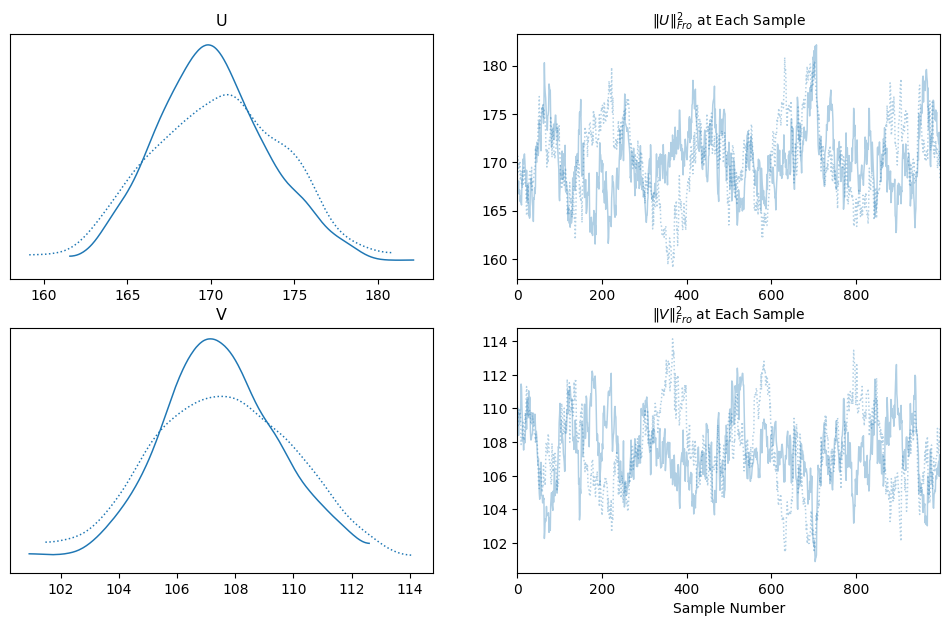

In [ ]:
hpmf_model_wESM_Hie_RandomEffects.traceplot()

In [ ]:
az.summary(hpmf_model_wESM_Hie_RandomEffects.idata,
           var_names=["sigma_obs", "beta_genus_sigma", "beta_species_sigma", "beta_strain_sigma", "w0_pc_sigma"])[['ess_bulk','ess_tail','r_hat']]

,ess_bulk,ess_tail,r_hat
sigma_obs,63.0,217.0,1.03
beta_genus_sigma,25.0,56.0,1.07
beta_species_sigma,24.0,85.0,1.03
beta_strain_sigma,37.0,97.0,1.03
w0_pc_sigma,35.0,131.0,1.02


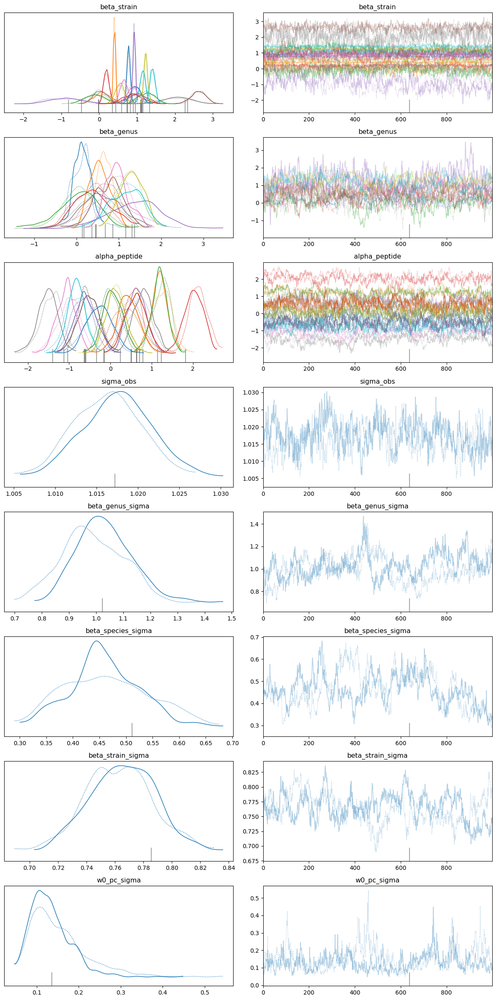

In [ ]:
idata = hpmf_model_wESM_Hie_RandomEffects.idata
peptide_list=train_df['Peptide ID'].unique()[:20]
species_list=train_df['Target Species'].unique()[:20]
genus_list=taxonomy_species[taxonomy_species['Target Species'].isin(train_df['Target Species'])]['genus'].unique()[:10]

# Always plot the global mean
var_names = []
coords = {}

if species_list is not None:
    var_names.append("beta_strain")
    # Convert string names to the integer indices used in the model
    coords["strain"] = [hpmf_model_wESM_Hie_RandomEffects.strain_dict[s] for s in species_list]
if genus_list is not None:
    var_names.append("beta_genus")
    # Convert string names to the integer indices used in the model
    coords["genus"] = [hpmf_model_wESM_Hie_RandomEffects.genus_dict[s] for s in genus_list]

if peptide_list is not None:
    var_names.append("alpha_peptide")
    coords["peptide"] = [hpmf_model_wESM_Hie_RandomEffects.peptide_dict[p] for p in peptide_list]

var_names.append("sigma_obs")
var_names.append("beta_genus_sigma")
var_names.append("beta_species_sigma")
var_names.append("beta_strain_sigma")
var_names.append("w0_pc_sigma")

# Plot using ArviZ
az.plot_trace(idata, var_names=var_names, coords=coords, figsize=(12, 3 * len(var_names)))
plt.tight_layout()
plt.show()